군집화

In [126]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
import statsmodels.api as sm
import scipy.stats
from scipy.stats import skew
from scipy.stats import spearmanr
from sklearn.cluster import KMeans
from IPython.display import Image

import matplotlib

matplotlib.rcParams['font.family'] ='Malgun Gothic'

matplotlib.rcParams['axes.unicode_minus'] =False

# 1. 데이터 살펴보기

train.csv (122400, 10)

>- train 데이터 : 60개 건물들의 2020년 6월 1일 부터 2020년 8월 24일까지의 데이터
>- 1시간 단위로 제공
>- 전력사용량(kWh) 포함

컬럼 'num'은 **건물번호**를 의미!

In [9]:
# 컬럼명 변환을 위한 리스트 할당
train_col = ['num', 'date_time', 'target', 'temp', 'wind', 'humid', 'rain', 'sunny', 'cooler', 'solar']

In [10]:
# 데이터 로드
train = pd.read_csv('C:/Users/SW_Cho/Desktop/energy/energy/train.csv', encoding='cp949', names=train_col, header=0)

In [79]:
def make_time(train):
    """
    시간 관련 변수를 추가하기 위한 함수
    """
    train['date_time'] = pd.to_datetime(train.date_time)
    
    train['month'] = train.date_time.dt.month                    # 월(숫자)
    train['day'] = train.date_time.dt.day                        # 일(숫자)
    train['hour'] = train.date_time.dt.hour                      # 시(숫자)
    train['weekday'] = train.date_time.dt.weekday                # 요일(숫자)
    train['dayofyear'] = train.date_time.dt.dayofyear            # 연 기준 몇일째(숫자)
    train['weekend']=train['weekday'].isin([5,6]).astype(int)
    train['date'] = train.date_time.dt.date                   
    
    
    return train

In [80]:
train = make_time(train)

In [13]:
# 6월 6일은 현충일, 8월 15일은 광복절, 8월 17일은 임시공휴일
# 휴일이 많지 않으니, 주말에 포함시키겠습니다.

train.loc[train.weekday >= 5, 'holiday'] = 1
train.loc[train.weekday < 5, 'holiday'] = 0
train.loc[(train.month == 8) & (train.day == 17), 'holiday'] = 1

In [14]:
train.head()

,num,date_time,target,temp,wind,humid,rain,sunny,cooler,solar,month,day,hour,weekday,dayofyear,holiday
0,1,2020-06-01 00:00:00,8179.056,17.6,2.5,92.0,0.8,0.0,0.0,0.0,6,1,0,0,153,0.0
1,1,2020-06-01 01:00:00,8135.640,17.7,2.9,91.0,0.3,0.0,0.0,0.0,6,1,1,0,153,0.0
2,1,2020-06-01 02:00:00,8107.128,17.5,3.2,91.0,0.0,0.0,0.0,0.0,6,1,2,0,153,0.0
3,1,2020-06-01 03:00:00,8048.808,17.1,3.2,91.0,0.0,0.0,0.0,0.0,6,1,3,0,153,0.0
4,1,2020-06-01 04:00:00,8043.624,17.0,3.3,92.0,0.0,0.0,0.0,0.0,6,1,4,0,153,0.0


In [ ]:
train.tail()

## 1.1 데이터의 구성
1. target 변수
    >- 'target' : 전력사용량
2.건물정보
    >- 'num' : 건물번호
    >- 'cooler' : 비전기냉방설비운영여부
    >-'solar' : 태양광보유여부
3.기후 정보
    >- 'temp' : 기온
    >- 'wind' : 풍속
    >- 'humi' : 습도
    >- 'rain' : 강수량
    >- 'sunny' : 일조

In [68]:
train.isna().sum()

num          0
date_time    0
target       0
temp         0
wind         0
humid        0
rain         0
sunny        0
cooler       0
solar        0
month        0
day          0
hour         0
weekday      0
dayofyear    0
holiday      0
dtype: int64

## 이상치 있나 X
### 'holiday' 컬럼 생성 (공휴일 + 주말)
- **6월 6일은 현충일, 8월 15일은 광복절, 8월 17일은 임시공휴일**
-  휴일이 많지 않으니, 주말에 포함도 포함시키자

In [70]:
train.loc[train.weekday >= 5, 'holiday'] = 1
train.loc[train.weekday < 5, 'holiday'] = 0
train.loc[(train.month == 8) & (train.day == 17), 'holiday'] = 1

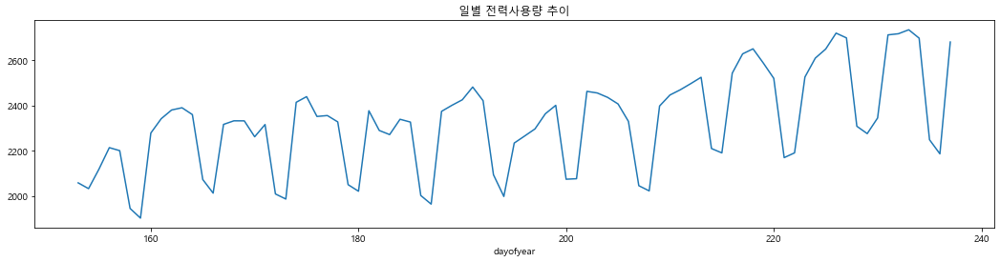

In [16]:
(train.groupby(['dayofyear'])['target'].mean()).plot(figsize=(18, 4))
plt.title('일별 전력사용량 추이')
plt.show()

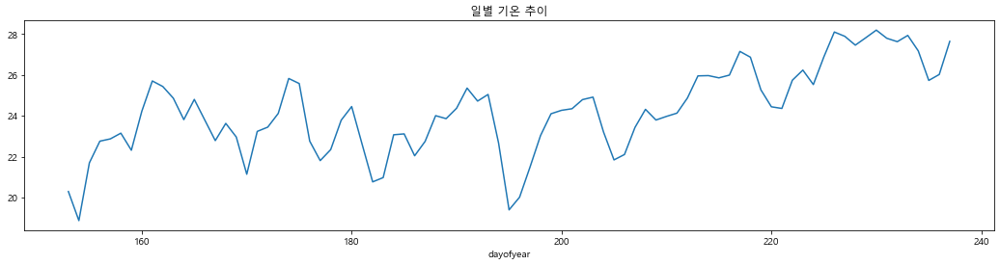

In [17]:
(train.groupby(['dayofyear'])['temp'].mean()).plot(figsize=(18, 4))
plt.title('일별 기온 추이')
plt.show()

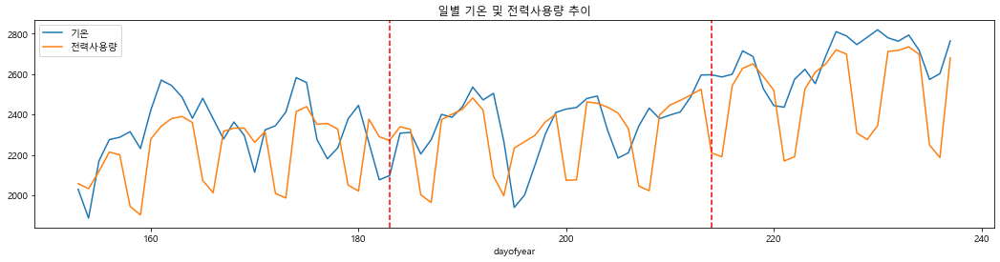

In [24]:
(train.groupby(['dayofyear'])['temp'].mean()*100).plot(figsize=(18, 4))
(train.groupby(['dayofyear'])['target'].mean()).plot(figsize=(18, 4))
plt.legend(['기온', '전력사용량'])
plt.axvline(x = 183, color = 'r', linestyle = '--',)
plt.axvline(x = 214, color = 'r', linestyle = '--',)
plt.title('일별 기온 및 전력사용량 추이')
plt.show()

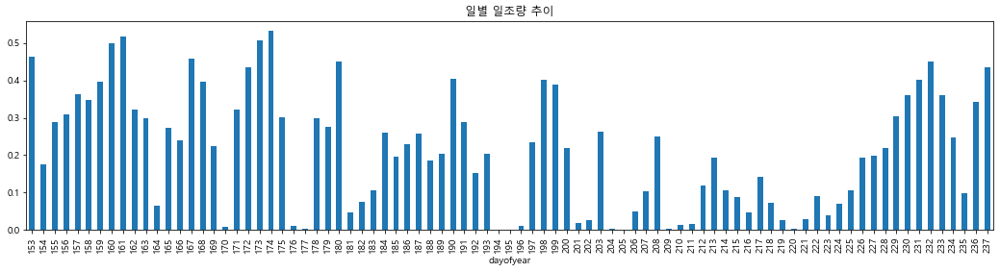

In [27]:
(train.groupby(['dayofyear'])['sunny'].mean()).plot(kind='bar', figsize=(18, 4))
plt.title('일별 일조량 추이')
plt.show()

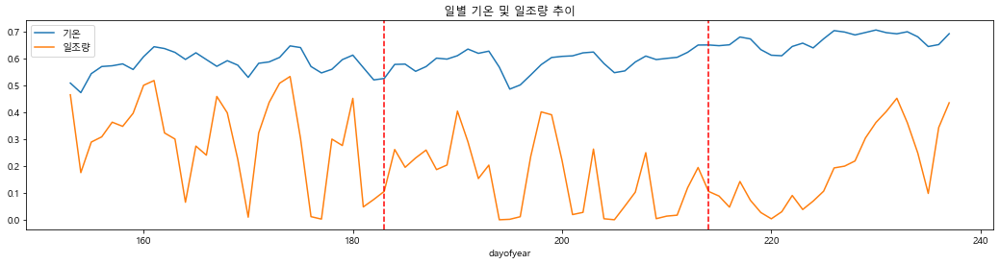

In [36]:
(train.groupby(['dayofyear'])['temp'].mean()*0.025).plot(figsize=(18, 4))
(train.groupby(['dayofyear'])['sunny'].mean()).plot(figsize=(18, 4))
plt.legend(['기온', '일조량'])
plt.axvline(x = 183, color = 'r', linestyle = '--',)
plt.axvline(x = 214, color = 'r', linestyle = '--',)
plt.title('일별 기온 및 일조량 추이')
plt.show()

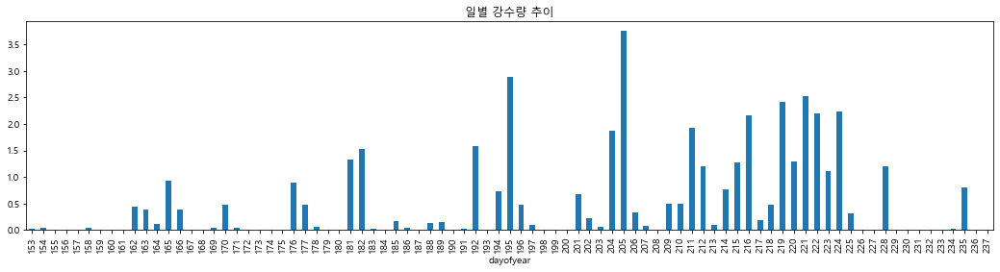

In [28]:
(train.groupby(['dayofyear'])['rain'].mean()).plot(kind='bar', figsize=(18, 4))
plt.title('일별 강수량 추이')
plt.show()

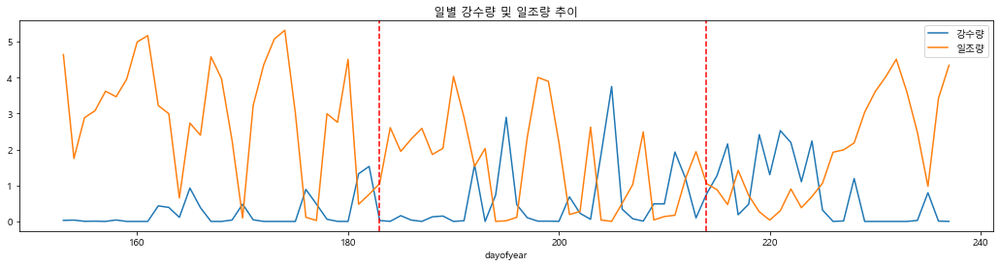

In [39]:
(train.groupby(['dayofyear'])['rain'].mean()).plot(figsize=(18, 4))
(train.groupby(['dayofyear'])['sunny'].mean()*10).plot(figsize=(18, 4))
plt.legend(['강수량', '일조량'])
plt.axvline(x = 183, color = 'r', linestyle = '--',)
plt.axvline(x = 214, color = 'r', linestyle = '--',)
plt.title('일별 강수량 및 일조량 추이')
plt.show()

In [40]:
train_sol_0 = train[train['solar'] == 0]
train_sol_1 = train[train['solar'] == 1]

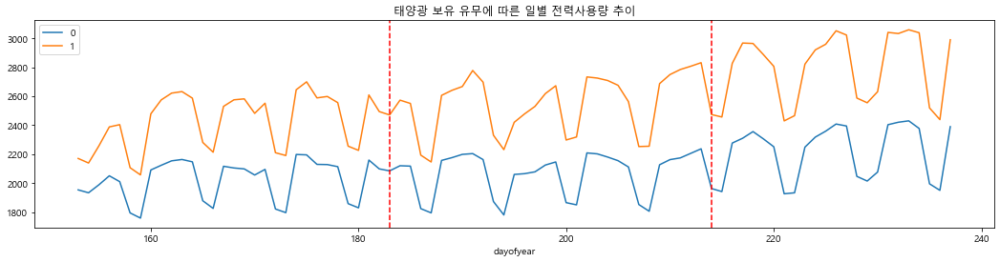

In [46]:
(train_sol_0.groupby(['dayofyear'])['target'].mean()).plot(figsize=(18, 4))
(train_sol_1.groupby(['dayofyear'])['target'].mean()).plot(figsize=(18, 4))
plt.legend(['0', '1'])
plt.axvline(x = 183, color = 'r', linestyle = '--',)
plt.axvline(x = 214, color = 'r', linestyle = '--',)
plt.title('태양광 보유 유무에 따른 일별 전력사용량 추이')
plt.show()

In [44]:
train_cool_0 = train[train['cooler'] == 0]
train_cool_1 = train[train['cooler'] == 1]

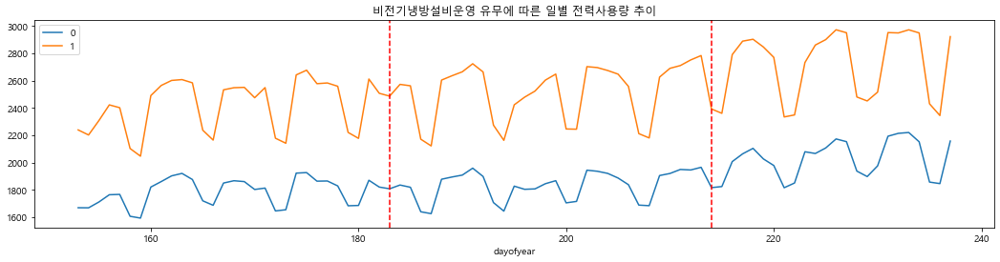

In [47]:
(train_cool_0.groupby(['dayofyear'])['target'].mean()).plot(figsize=(18, 4))
(train_cool_1.groupby(['dayofyear'])['target'].mean()).plot(figsize=(18, 4))
plt.legend(['0', '1'])
plt.axvline(x = 183, color = 'r', linestyle = '--',)
plt.axvline(x = 214, color = 'r', linestyle = '--',)
plt.title('비전기냉방설비운영 유무에 따른 일별 전력사용량 추이')
plt.show()

In [50]:
train_sol_0_0 = train_cool_0[train_cool_0['solar'] == 0]
train_sol_0_1 = train_cool_0[train_cool_0['solar'] == 1]

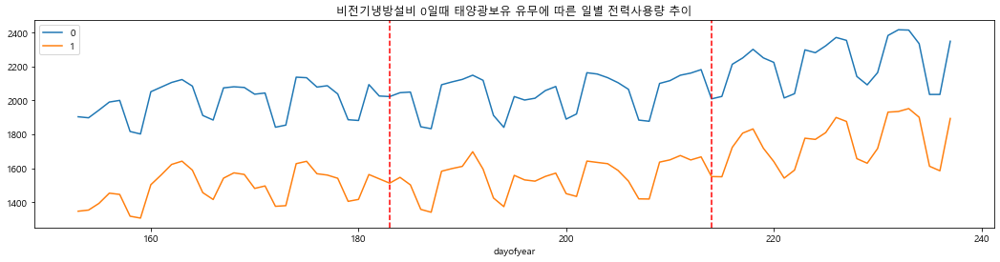

In [51]:
(train_sol_0_0.groupby(['dayofyear'])['target'].mean()).plot(figsize=(18, 4))
(train_sol_0_1.groupby(['dayofyear'])['target'].mean()).plot(figsize=(18, 4))
plt.legend(['0', '1'])
plt.axvline(x = 183, color = 'r', linestyle = '--',)
plt.axvline(x = 214, color = 'r', linestyle = '--',)
plt.title('비전기냉방설비 0일때 태양광보유 유무에 따른 일별 전력사용량 추이')
plt.show()

In [54]:
train_sol_1_0 = train_cool_1[train_cool_1['solar'] == 0]
train_sol_1_1 = train_cool_1[train_cool_1['solar'] == 1]

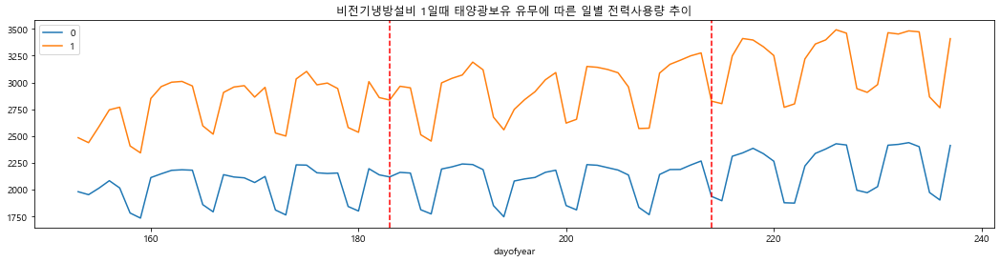

In [62]:
(train_sol_1_0.groupby(['dayofyear'])['target'].mean()).plot(figsize=(18, 4))
(train_sol_1_1.groupby(['dayofyear'])['target'].mean()).plot(figsize=(18, 4))
plt.legend(['0', '1'])
plt.axvline(x = 183, color = 'r', linestyle = '--',)
plt.axvline(x = 214, color = 'r', linestyle = '--',)
plt.title('비전기냉방설비 1일때 태양광보유 유무에 따른 일별 전력사용량 추이')
plt.show()

In [63]:
train_cool_0_0 = train_sol_0[train_sol_0['cooler'] == 0]
train_cool_0_1 = train_sol_0[train_sol_0['cooler'] == 1]

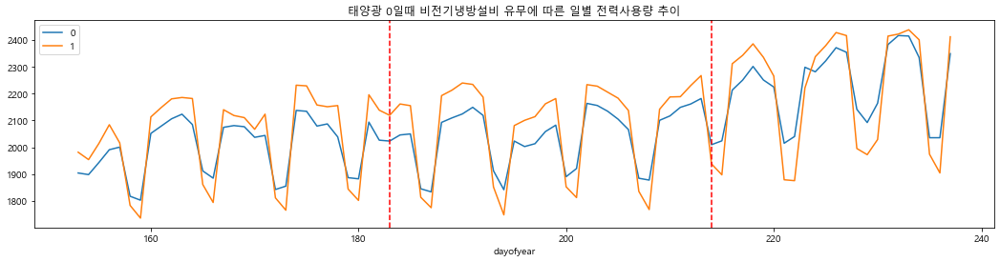

In [64]:
(train_cool_0_0.groupby(['dayofyear'])['target'].mean()).plot(figsize=(18, 4))
(train_cool_0_1.groupby(['dayofyear'])['target'].mean()).plot(figsize=(18, 4))
plt.legend(['0', '1'])
plt.axvline(x = 183, color = 'r', linestyle = '--',)
plt.axvline(x = 214, color = 'r', linestyle = '--',)
plt.title('태양광 0일때 비전기냉방설비 유무에 따른 일별 전력사용량 추이')
plt.show()

In [65]:
train_cool_1_0 = train_sol_1[train_sol_1['cooler'] == 0]
train_cool_1_1 = train_sol_1[train_sol_1['cooler'] == 1]

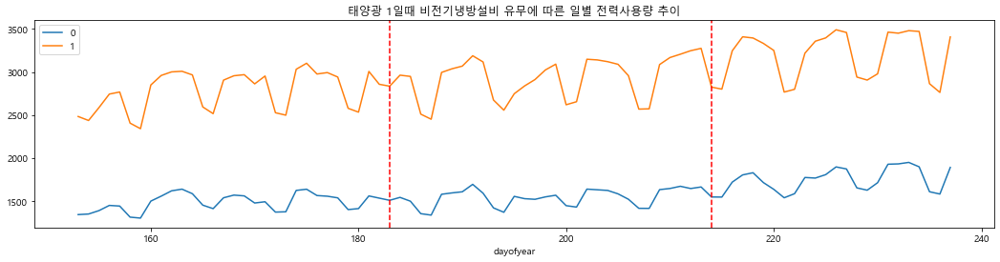

In [71]:
(train_cool_1_0.groupby(['dayofyear'])['target'].mean()).plot(figsize=(18, 4))
(train_cool_1_1.groupby(['dayofyear'])['target'].mean()).plot(figsize=(18, 4))
plt.legend(['0', '1'])
plt.axvline(x = 183, color = 'r', linestyle = '--',)
plt.axvline(x = 214, color = 'r', linestyle = '--',)
plt.title('태양광 1일때 비전기냉방설비 유무에 따른 일별 전력사용량 추이')
plt.show()

## 2.1 Heatmap으로 변수간 상관관계 확인
### 2.1.1 전체 변수간 상관관계 보기

<AxesSubplot:>

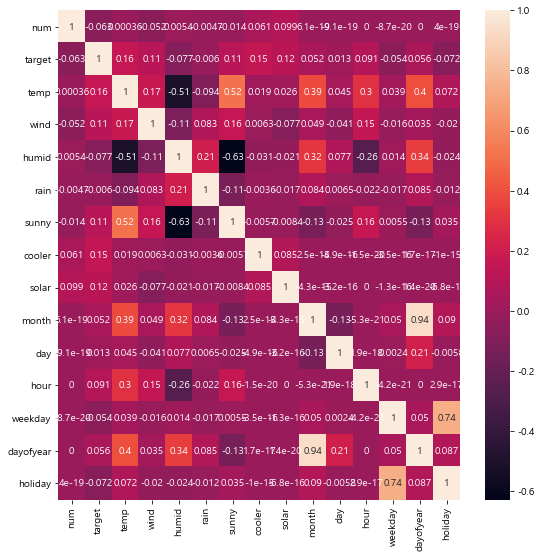

In [72]:
train.corr()

plt.figure(figsize=(9,9))
sns.heatmap(train.corr(),annot=True)

#### target(전력사용량)과 가장 상관관계가 큰 변수 순서는
> temperature(온도) > nelec_cool_flag(비전기냉방설비운영여부) > solar_flag(태양광보유여부) > (windspeed(풍속), insolation(일조) > hour(시간)

### 2.1.2 target 과 시간요인 상관관계 보기

<AxesSubplot:>

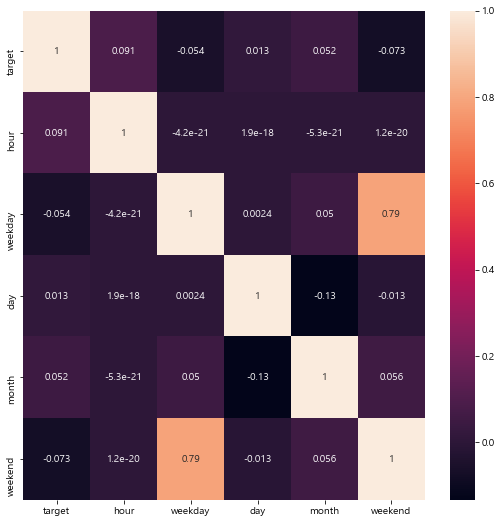

In [81]:
feature = ['target','hour','weekday','day','month','weekend']
c_elec = train[feature]

c_elec.corr()

plt.figure(figsize=(9,9))
sns.heatmap(c_elec.corr(),annot=True)

#### target과 시간관련 변수 중 상관관계 큰 변수
> hour > weekend(-) > weekday > month 

### 2.1.3 target과 기상요인 상관관계 보기

<AxesSubplot:>

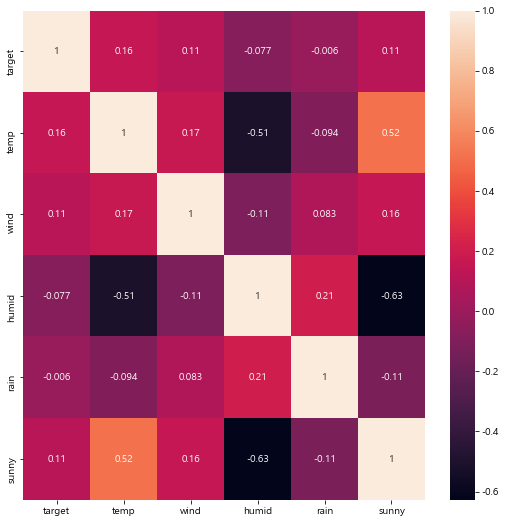

In [85]:
feature = ['target','temp','wind','humid','rain','sunny']
c_elec = train[feature]

c_elec.corr()

plt.figure(figsize=(9,9))
sns.heatmap(c_elec.corr(),annot=True)

#### target과 기상관련 변수 중 상관관계 큰 변수
> temperature > windspeed > insolation > humidity

### 2.1.4 target과 건물 정보의 상관관계보기

<AxesSubplot:>

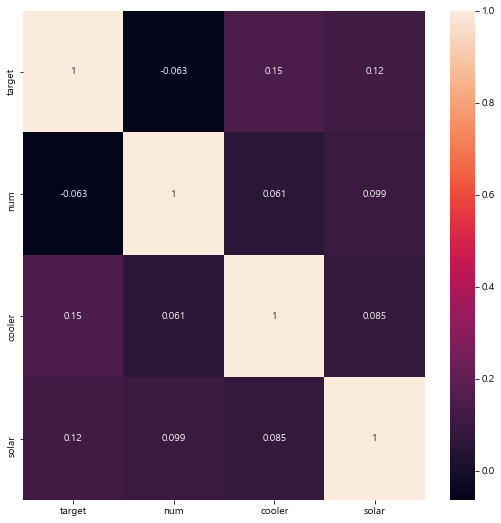

In [87]:
feature = ['target','num', 'cooler','solar' ]
c_elec = train[feature]

c_elec.corr()

plt.figure(figsize=(9,9))
sns.heatmap(c_elec.corr(),annot=True)

## 2.2 건물 별 히트맵 
- 'weekday', 'hour'로  'target'패턴 시각화
- weekday y축 위에서부터 0(월) - 6(일)

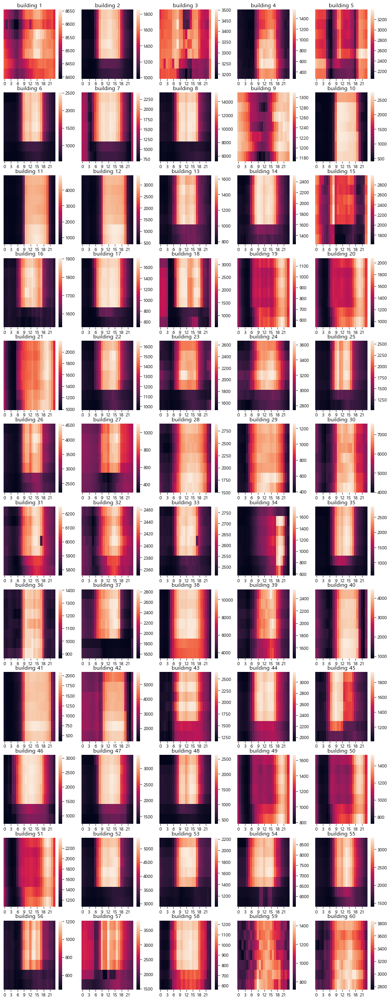

In [90]:
fig = plt.figure(figsize = (15, 40))
for num in train['num'].unique():
    df = train[train.num == num]
    df = df.groupby(['weekday', 'hour'])['target'].mean().reset_index().pivot('weekday', 'hour', 'target')
    plt.subplot(12, 5, num)
    sns.heatmap(df)
    plt.title(f'building {num}')
    plt.xlabel('')
    plt.ylabel('')
    plt.yticks([])
    

    #### 건물 패턴 분석
- building 2번 회사일 가능성이 높음. 주말 출근 없는!
- builiding 9번은 공장일것 같다.
- budiding 10,11,12 등 여러 건물들이 **9시 - 20,21시 주말 상관없이 전략사용량이 많은 건물**들은 뭐지?
> - 추측 1. 회사 + 상가인 건물일수도 있겠다.
> - 추측 2. 도서관 or 학원
> - 추측 3. 스터디카페
> - 추측 4. 전력 단가 달라서 어떤 용도의 전력을 사용한건지 

- 불쾌지수, 체감온도 컬럼 추가 하는 방향도 생각해보기

# 3. Tableu EDA

## 3.1 temperature(기온) 관련 시각화

In [92]:
!pip install IPython 

In [93]:
from IPython.display import Image

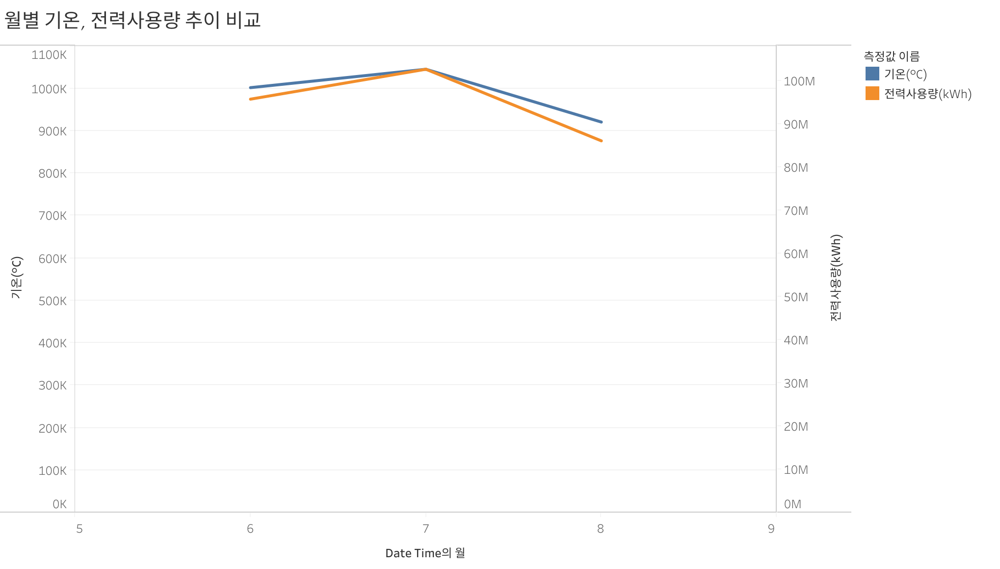

In [96]:
Image('Sheet 1.1.png',width=1024)

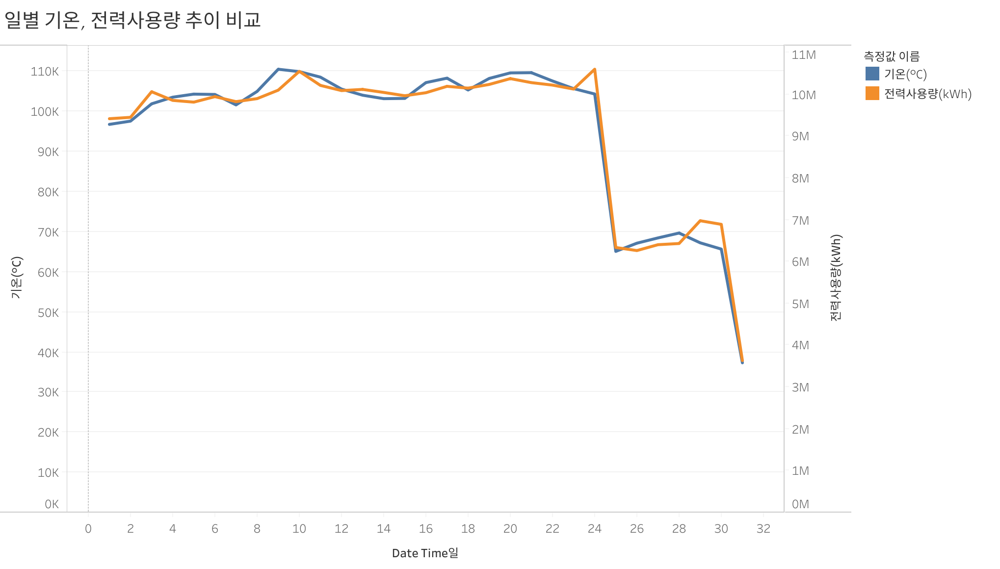

In [98]:
Image('Sheet 1 (1).png',width=1000)

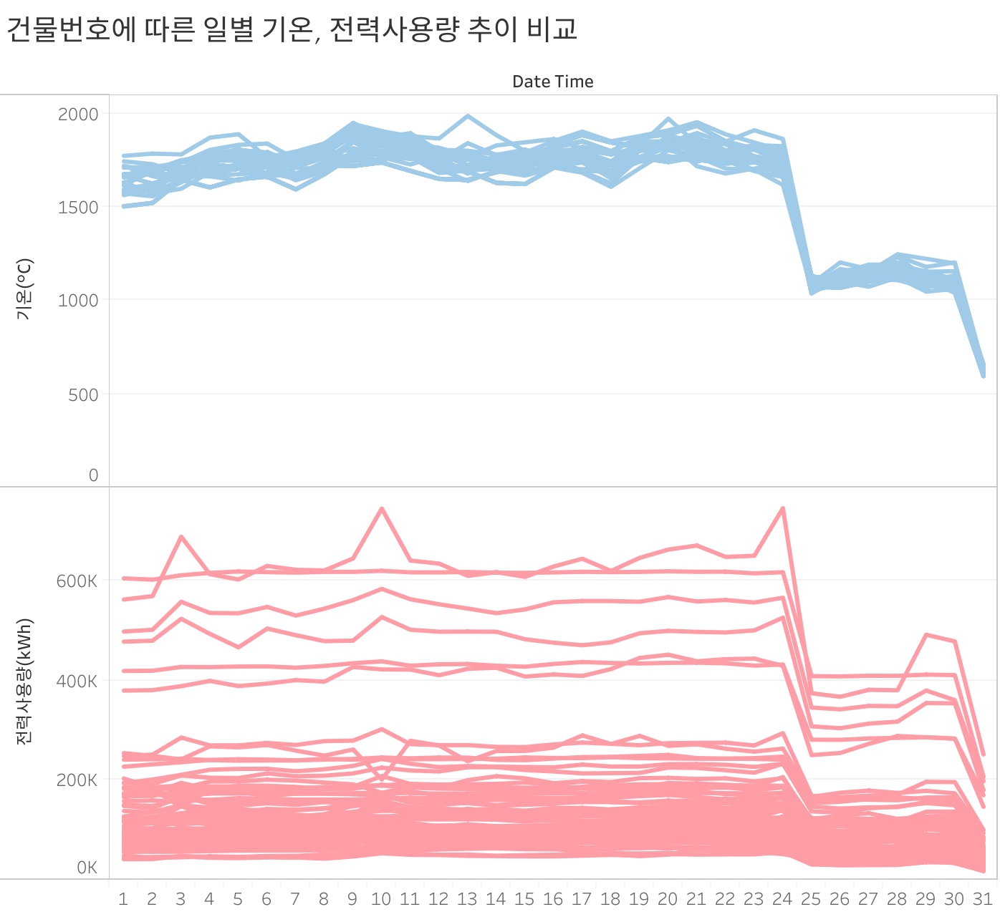

In [99]:
Image('im1.png',width=850)

## 3.2 nelec_cool_flag(비전기냉방설비운영여부) 관련 시각화

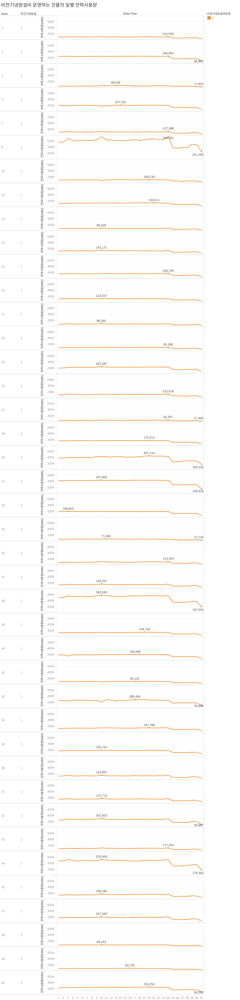

In [100]:
Image('시트 2 (1).png',width = 1024)

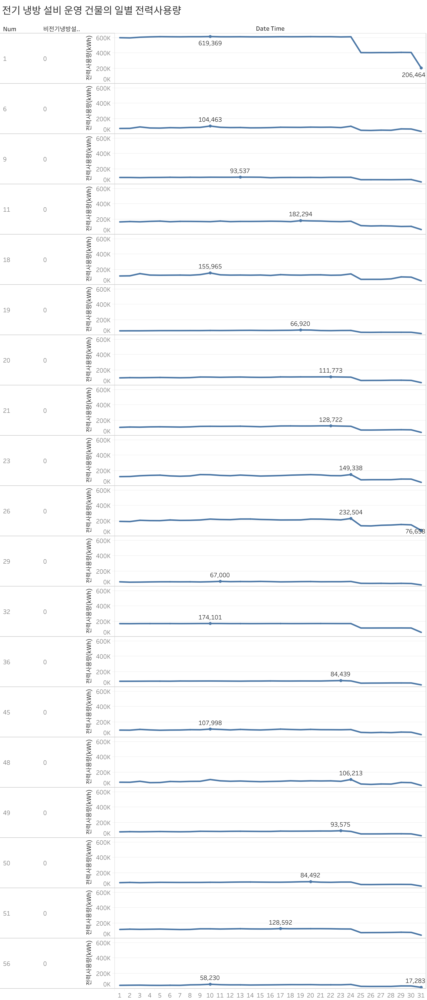

In [101]:
Image('Sheet 1.0.png',width=880)

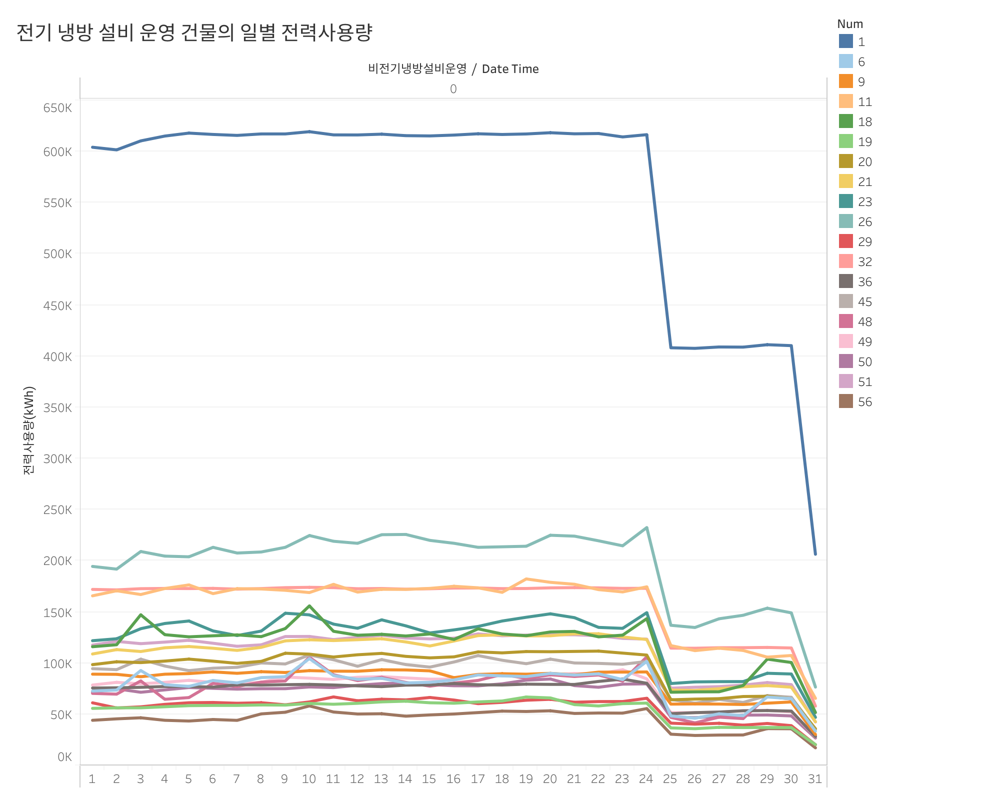

In [102]:
Image('대시보드 1 (2).png',width=1024)

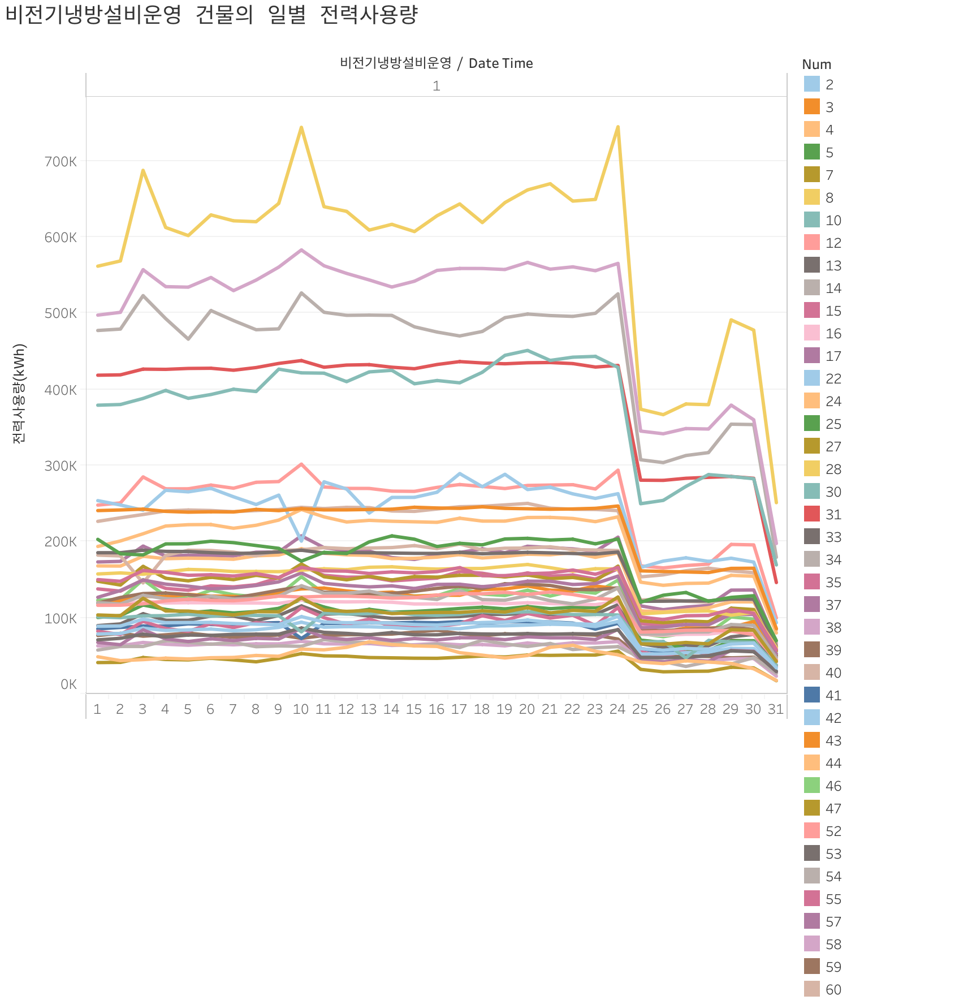

In [103]:
Image('Sheet 1 (3).png',width=1024)

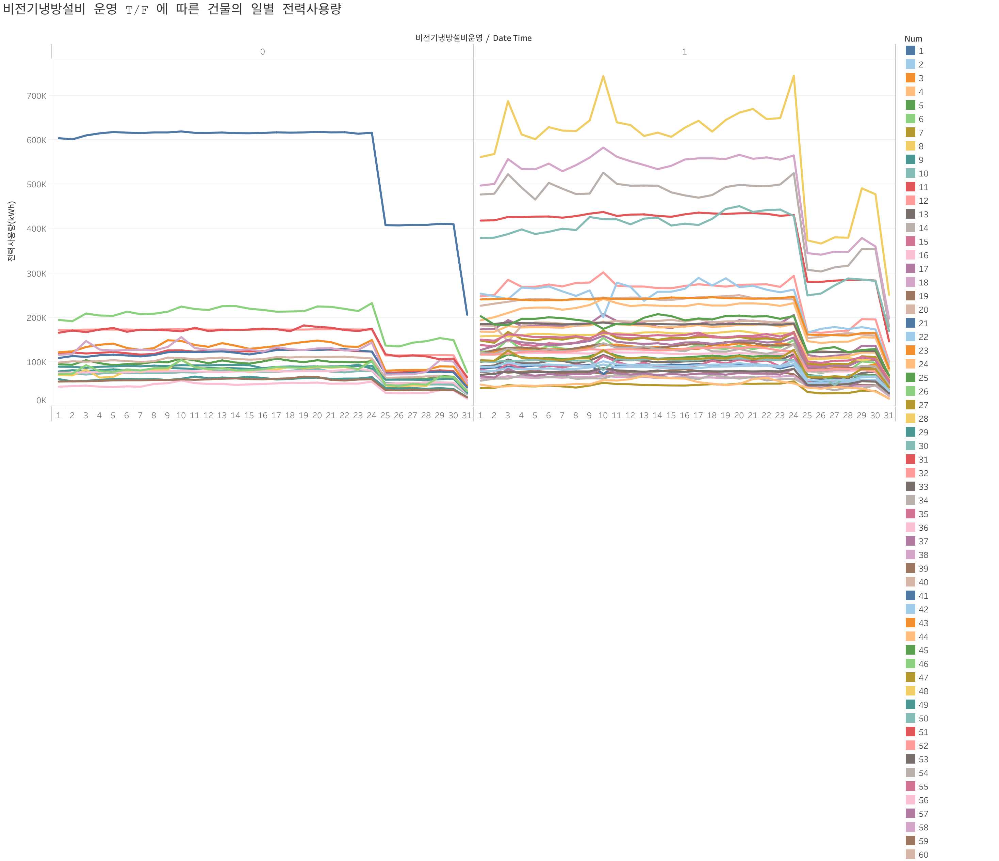

In [104]:
# 일별
Image('Sheet 1 (2).png',width=1024)

### 왜 건물별 패턴이 다 24일부터 급락하는걸까?
> - 8월 24일부터 데이터가 없음 (그 후는 test 데이터셋)
> - 6월이 30일까지 있기 때문에 31일 데이터가 없어서 저런 패턴이 나온다.

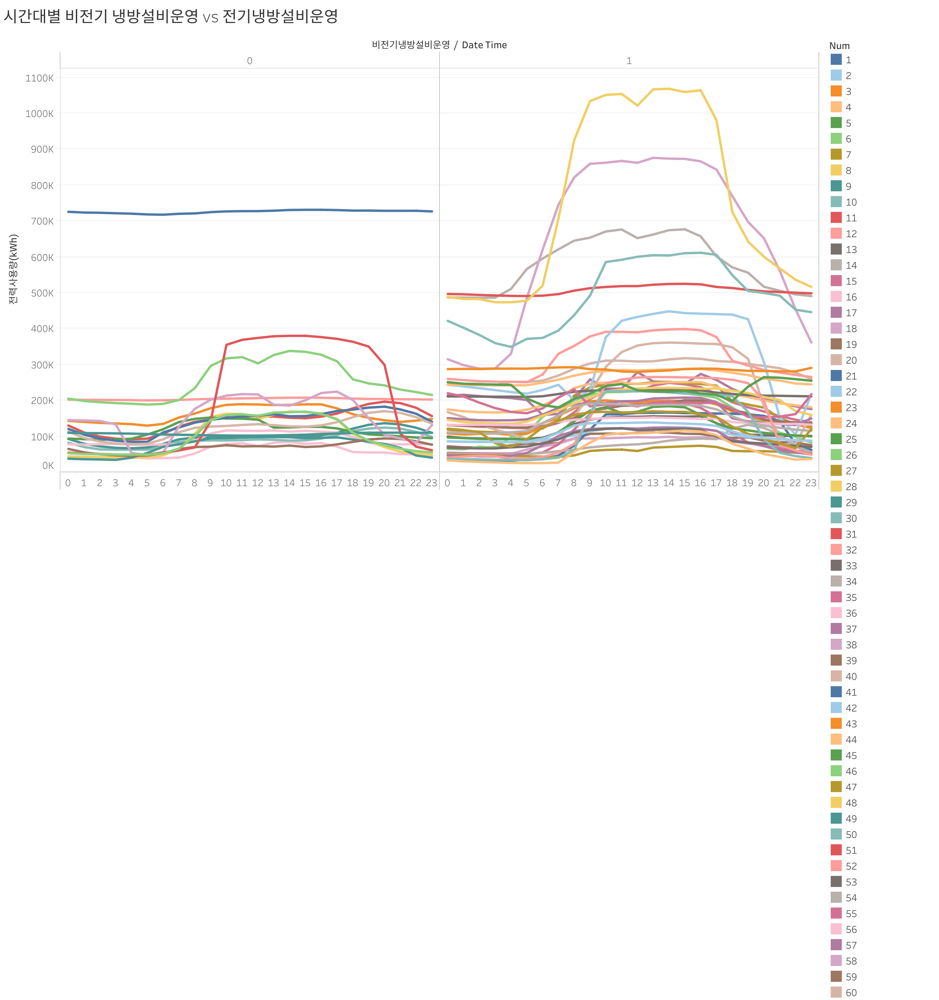

In [105]:
# 시간별
Image('Sheet 1 (5).png',width=1024)

### 시간대 상관없이 전력사용량이 많고 일정한 건물은 뭘까?
> - 1번(왼쪽 파란색) 건물은 히트맵과 시간대별 그래프를 봤을 때 공장이 확신한 것 같다! -> 은행, 병원의 가능성도 있을 듯?

### 군집화 기준 세워서 시각화해보자
> - 건물 용도별이 아닌 전력 용도별(주택용,상업용,일반용,교육용) 클러스터링
> - 병원은 어디 속하는가

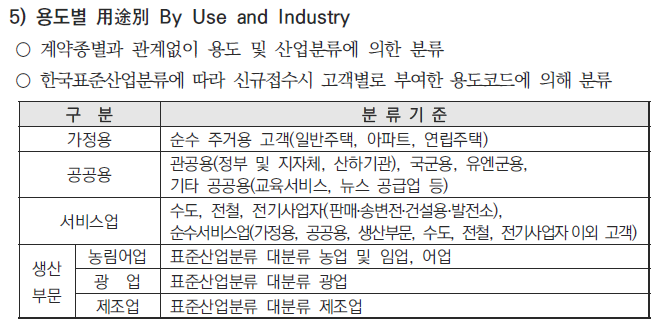![image.png](attachment:https://www.notion.so/874ddd4e066344ce8240b05b5065e09c#c045db9a6b93463f8805231f22c21baa![image.png](attachment:image.png))

### 해볼것
- 'holiday'(주말 + 공휴일) 만들어서 시각화해보기, 평일 비교하거나 어쨌든 요일별 시각화! -> 1번에서

# 4. 군집화 

In [114]:
train_origin = train.copy()

In [115]:
# 정확한 군집화를 위한 스케일링
for i in range(1, 61):
    mean_ = train_origin.loc[train_origin.num == i].target.mean()
    std_ = train_origin.loc[train_origin.num == i].target.std()
    train_origin.loc[train_origin.num == i, 'target'] = ((train_origin.loc[train_origin.num == i, 'target']) - mean_) / std_    
    

In [116]:
    # 요일에 따른 평균 값 산출
weekday_mean = (
    train_origin.groupby(['num', 'weekday'])['target'].mean()
    .reset_index()
    .pivot('num', 'weekday', 'target')
    .reset_index()
)

In [117]:
# 시간에 따른 평균 값 산출
hour_mean = (
    train_origin.groupby(['num', 'hour'])['target'].mean()
    .reset_index()
    .pivot('num', 'hour', 'target')
    .reset_index()
    .drop('num', axis=1)
)

In [118]:
# 요일별, 시간별 평균 전력 사용량 테이블 구축
cl_df = pd.concat([weekday_mean, hour_mean], axis=1)

In [119]:
# 보기 편하게 컬럼 이름 지정
columns = (
    ['num']
    + ['day_mean_' + str(i) for i in range(7)]
    + ['hour_mean_' + str(i) for i in range(24)]
)

cl_df.columns = columns

In [120]:
cl_df.head()

,num,day_mean_0,day_mean_1,day_mean_2,day_mean_3,day_mean_4,day_mean_5,day_mean_6,hour_mean_0,hour_mean_1,...,hour_mean_14,hour_mean_15,hour_mean_16,hour_mean_17,hour_mean_18,hour_mean_19,hour_mean_20,hour_mean_21,hour_mean_22,hour_mean_23
0,1,-0.013265,-0.275141,0.065127,0.136859,0.207538,0.004373,-0.124387,-0.022265,-0.200351,...,0.438781,0.486945,0.490691,0.413908,0.283379,0.294580,0.227571,0.228683,0.234710,0.079624
1,2,0.219825,0.246954,0.266059,0.304359,0.269986,-0.613713,-0.711788,-0.843264,-0.871100,...,0.927692,0.887512,0.828227,0.656724,0.131663,-0.303718,-0.510565,-0.631740,-0.747649,-0.802314
2,3,-0.001191,0.002234,0.155745,0.198316,0.176369,-0.176871,-0.354502,0.068953,0.104412,...,-0.179592,0.098628,0.158603,0.145217,-0.076369,-0.251865,-0.282285,-0.342865,-0.345398,0.297465
3,4,-0.156680,-0.169906,-0.071670,0.060515,0.121706,0.223918,0.005172,-0.738844,-0.803466,...,1.145659,1.201668,1.142114,0.907742,0.348254,0.022042,-0.321251,-0.510391,-0.682189,-0.649852
4,5,0.014861,-0.025999,-0.040268,-0.070623,0.304741,0.074887,-0.258837,0.581476,0.466763,...,-0.168711,-0.120386,-0.313461,-0.438549,-0.915961,0.234951,0.996338,0.953813,0.837413,0.710313


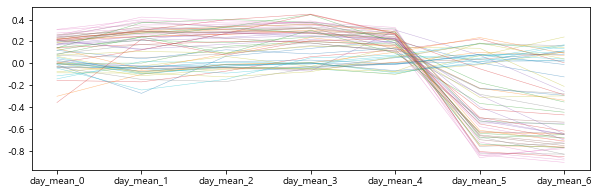

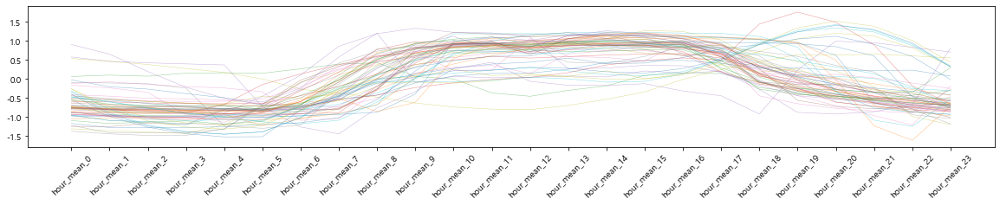

In [121]:
# 시각화를 통한 확인
fig = plt.figure(figsize = (10,3))
for i in range(len(cl_df)):
    plt.plot(cl_df.iloc[i, 1:8], alpha = 0.5, linewidth = 0.5)
    
fig = plt.figure(figsize = (20,3))
for i in range(len(cl_df)):
    plt.plot(cl_df.iloc[i, 8:32], alpha = 0.5, linewidth = 0.5)
    plt.xticks(rotation=45)
    

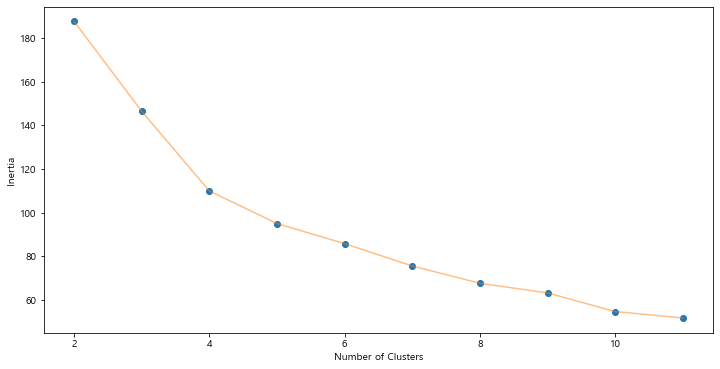

In [127]:
# elbow method를 통해 군집의 개수 결정
def change_n_clusters(n_clusters, data):
    sum_of_squared_distance = []
    for n_cluster in n_clusters:
        kmeans = KMeans(n_clusters=n_cluster)
        kmeans.fit(data)
        sum_of_squared_distance.append(kmeans.inertia_)
        
    plt.figure(1 , figsize = (12, 6))
    plt.plot(n_clusters , sum_of_squared_distance , 'o')
    plt.plot(n_clusters , sum_of_squared_distance , '-' , alpha = 0.5)
    plt.xlabel('Number of Clusters')
    plt.ylabel('Inertia')

change_n_clusters([2,3,4,5,6,7,8,9,10,11], cl_df.iloc[:,1:])

In [128]:
# 엘보우 포인트를 통해 kmeans 클러스터링
model = KMeans(n_clusters = 4, random_state = 42)
pred = model.fit_predict(cl_df.iloc[:, 1:])

In [129]:
# 값 할당
cl_df['km_cluster'] = pred

In [130]:
# 기존 train set과 merge
train_cl = pd.merge(train_origin, cl_df[['num', 'km_cluster']], how='left', on='num')

In [131]:
train_cl.head()

,num,date_time,target,temp,wind,humid,rain,sunny,cooler,solar,month,day,hour,weekday,dayofyear,holiday,weekend,date,km_cluster
0,1,2020-06-01 00:00:00,-2.795969,17.6,2.5,92.0,0.8,0.0,0.0,0.0,6,1,0,0,153,0.0,0,2020-06-01,1
1,1,2020-06-01 01:00:00,-3.129259,17.7,2.9,91.0,0.3,0.0,0.0,0.0,6,1,1,0,153,0.0,0,2020-06-01,1
2,1,2020-06-01 02:00:00,-3.348135,17.5,3.2,91.0,0.0,0.0,0.0,0.0,6,1,2,0,153,0.0,0,2020-06-01,1
3,1,2020-06-01 03:00:00,-3.795838,17.1,3.2,91.0,0.0,0.0,0.0,0.0,6,1,3,0,153,0.0,0,2020-06-01,1
4,1,2020-06-01 04:00:00,-3.835633,17.0,3.3,92.0,0.0,0.0,0.0,0.0,6,1,4,0,153,0.0,0,2020-06-01,1


In [132]:
train_cl['target'].max()

4.400723682207587

In [133]:
train_cl[train_cl['target']== -15.83359997303773]

,num,date_time,target,temp,wind,humid,rain,sunny,cooler,solar,month,day,hour,weekday,dayofyear,holiday,weekend,date,km_cluster


C:\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='target', ylabel='Density'>

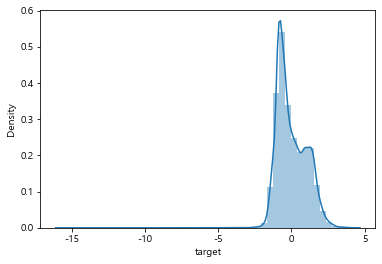

In [134]:
sns.distplot(train_cl['target'])

In [135]:
# 군집별 분석을 위한 4개의 데이터셋 할당
km_0 = list(train_cl.loc[train_cl.km_cluster == 0].num.unique())
km_1 = list(train_cl.loc[train_cl.km_cluster == 1].num.unique())
km_2 = list(train_cl.loc[train_cl.km_cluster == 2].num.unique())
km_3 = list(train_cl.loc[train_cl.km_cluster == 3].num.unique())

In [136]:
print(km_0)
print(km_1)
print(km_2)
print(km_3)

[2, 6, 7, 8, 13, 14, 16, 17, 18, 22, 23, 24, 25, 26, 27, 31, 33, 35, 37, 38, 43, 44, 45, 46, 47, 48, 52, 53, 54, 55, 56, 57, 58]
[1, 3, 5, 9, 15]
[4, 10, 11, 12, 28, 29, 30, 32, 36, 39, 40, 41, 42, 59, 60]
[19, 20, 21, 34, 49, 50, 51]


## 4.1 군집 유형 비교

In [137]:
train_cl.groupby(['km_cluster'])['num'].count().to_frame()/2040

,num
km_cluster,
0,33.0
1,5.0
2,15.0
3,7.0


## 4.2 군집 유형별 건물 비교

In [143]:
def building_cluster(km,cnt):
    fig = plt.figure(figsize=(18, np.ceil(len(km)/cnt)*4))
    for i, n in enumerate(km):
        plt.subplot(np.ceil(len(km)/cnt), cnt, i+1)
        plt.title("{} heatmap".format(n))
        sns.heatmap(train.loc[train.num == n].groupby(['weekday', 'hour'])['target'].mean().unstack().T)

<ipython-input-143-ed626b8c2aba>:4: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(np.ceil(len(km)/cnt), cnt, i+1)
<ipython-input-143-ed626b8c2aba>:4: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(np.ceil(len(km)/cnt), cnt, i+1)
<ipython-input-143-ed626b8c2aba>:4: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(np.ceil(len(km)/cnt), cnt, i+1)
<ipython-input-143-ed626b8c2aba>:4: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(np.ceil(len(km)/cnt), cnt, i+1)
<ipython-input-143-ed626b8c2

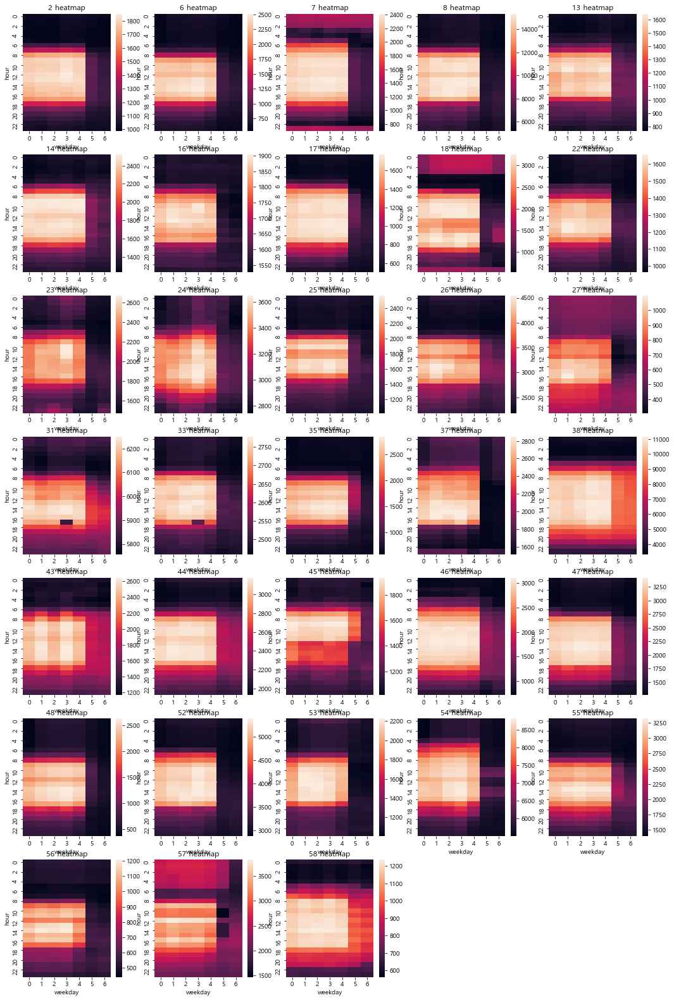

In [144]:
# 0번 유형
building_cluster(km_0,5)

### 0번 유형의 건물
> - 34번 건물빼고 다 새벽 2-6시 빼고는 전력사용량이 주말 상관없이 꾸준한 편이다.
> - 그래서 19,20,21,49,50,51번 건물들은 술집, 음식점이 있는 상가건물로 추측된다.
> - 그럼 34번만 너무 다른데 34번은 유흥시설로 추측됨

<ipython-input-143-ed626b8c2aba>:4: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(np.ceil(len(km)/cnt), cnt, i+1)
<ipython-input-143-ed626b8c2aba>:4: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(np.ceil(len(km)/cnt), cnt, i+1)
<ipython-input-143-ed626b8c2aba>:4: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(np.ceil(len(km)/cnt), cnt, i+1)
<ipython-input-143-ed626b8c2aba>:4: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(np.ceil(len(km)/cnt), cnt, i+1)
<ipython-input-143-ed626b8c2

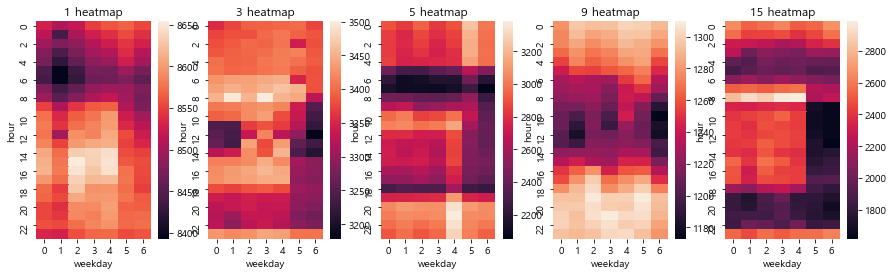

In [145]:
# 1번 유형
building_cluster(km_1,6)

### 1번 유형의 건물
> - 대부분 평일 9시에서 5시 사이의 전략사용량이 집중되어있다.
> - 회사이거나 학교로 추측됨
> - 38번과 58번은 주말출근이 잦은 회사인가보다.
> - 57번은 서버 돌리는 회사인 걸로 추측됨.

<ipython-input-143-ed626b8c2aba>:4: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(np.ceil(len(km)/cnt), cnt, i+1)
<ipython-input-143-ed626b8c2aba>:4: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(np.ceil(len(km)/cnt), cnt, i+1)
<ipython-input-143-ed626b8c2aba>:4: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(np.ceil(len(km)/cnt), cnt, i+1)
<ipython-input-143-ed626b8c2aba>:4: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(np.ceil(len(km)/cnt), cnt, i+1)
<ipython-input-143-ed626b8c2

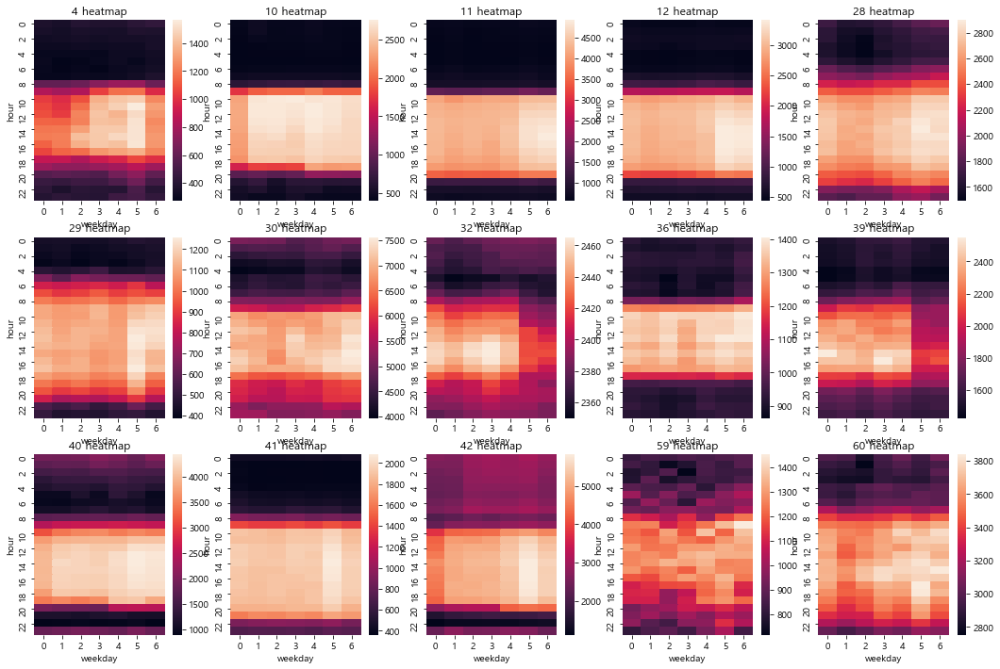

In [146]:
# 2번 유형
building_cluster(km_2,5)

### 2번 유형의 건물
> - 대부분 요일, 시간 상관없이 전력사용량이 많은데 공장, 병원, 은행과 같은 건물이 아닐까?
> - 근데 제각각 패턴이 좀 많이 다르다.
> - 15번은 게더타운일까..?

<ipython-input-143-ed626b8c2aba>:4: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(np.ceil(len(km)/cnt), cnt, i+1)
<ipython-input-143-ed626b8c2aba>:4: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(np.ceil(len(km)/cnt), cnt, i+1)
<ipython-input-143-ed626b8c2aba>:4: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(np.ceil(len(km)/cnt), cnt, i+1)
<ipython-input-143-ed626b8c2aba>:4: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(np.ceil(len(km)/cnt), cnt, i+1)
<ipython-input-143-ed626b8c2

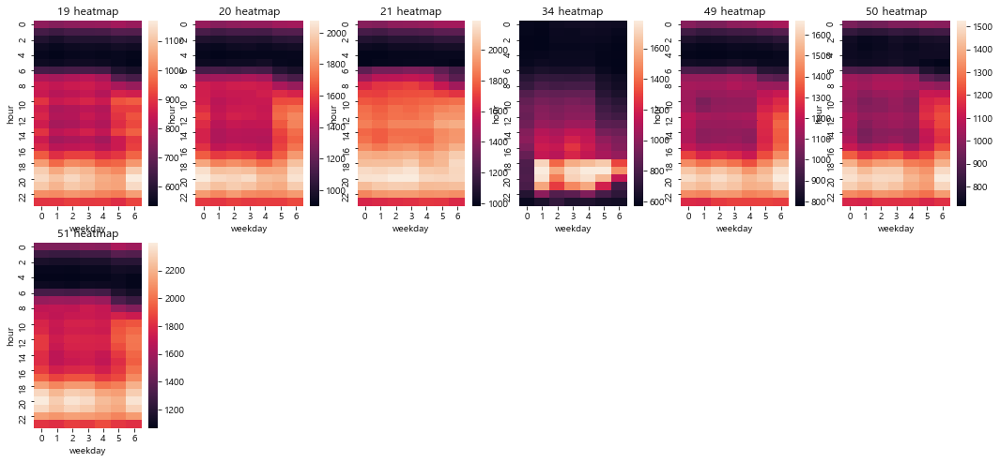

In [147]:
# 3번 유형
building_cluster(km_3,6)

### 3번 유형의 건물
> - 주말 상관없이 10시에서 오후 8시 사이에 전력사용량이 많다.
> - 새벽에는 안여는걸 봐선 음식점만 있는 상가 건물인건가?

## 4.3 군집화 패턴별 시각화 해보자!

In [148]:
train_cl.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 122400 entries, 0 to 122399
Data columns (total 19 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   num         122400 non-null  int64         
 1   date_time   122400 non-null  datetime64[ns]
 2   target      122400 non-null  float64       
 3   temp        122400 non-null  float64       
 4   wind        122400 non-null  float64       
 5   humid       122400 non-null  float64       
 6   rain        122400 non-null  float64       
 7   sunny       122400 non-null  float64       
 8   cooler      122400 non-null  float64       
 9   solar       122400 non-null  float64       
 10  month       122400 non-null  int64         
 11  day         122400 non-null  int64         
 12  hour        122400 non-null  int64         
 13  weekday     122400 non-null  int64         
 14  dayofyear   122400 non-null  int64         
 15  holiday     122400 non-null  float64       
 16  we

In [150]:
train_cl = train_cl.astype({'holiday':'int','cooler':'int','solar':'int'})
train_cl.head()

,num,date_time,target,temp,wind,humid,rain,sunny,cooler,solar,month,day,hour,weekday,dayofyear,holiday,weekend,date,km_cluster
0,1,2020-06-01 00:00:00,-2.795969,17.6,2.5,92.0,0.8,0.0,0,0,6,1,0,0,153,0,0,2020-06-01,1
1,1,2020-06-01 01:00:00,-3.129259,17.7,2.9,91.0,0.3,0.0,0,0,6,1,1,0,153,0,0,2020-06-01,1
2,1,2020-06-01 02:00:00,-3.348135,17.5,3.2,91.0,0.0,0.0,0,0,6,1,2,0,153,0,0,2020-06-01,1
3,1,2020-06-01 03:00:00,-3.795838,17.1,3.2,91.0,0.0,0.0,0,0,6,1,3,0,153,0,0,2020-06-01,1
4,1,2020-06-01 04:00:00,-3.835633,17.0,3.3,92.0,0.0,0.0,0,0,6,1,4,0,153,0,0,2020-06-01,1


In [151]:
train_cl.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 122400 entries, 0 to 122399
Data columns (total 19 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   num         122400 non-null  int64         
 1   date_time   122400 non-null  datetime64[ns]
 2   target      122400 non-null  float64       
 3   temp        122400 non-null  float64       
 4   wind        122400 non-null  float64       
 5   humid       122400 non-null  float64       
 6   rain        122400 non-null  float64       
 7   sunny       122400 non-null  float64       
 8   cooler      122400 non-null  int32         
 9   solar       122400 non-null  int32         
 10  month       122400 non-null  int64         
 11  day         122400 non-null  int64         
 12  hour        122400 non-null  int64         
 13  weekday     122400 non-null  int64         
 14  dayofyear   122400 non-null  int64         
 15  holiday     122400 non-null  int32         
 16  we

In [152]:
train_cl.to_csv('train_cl.csv',index=False)

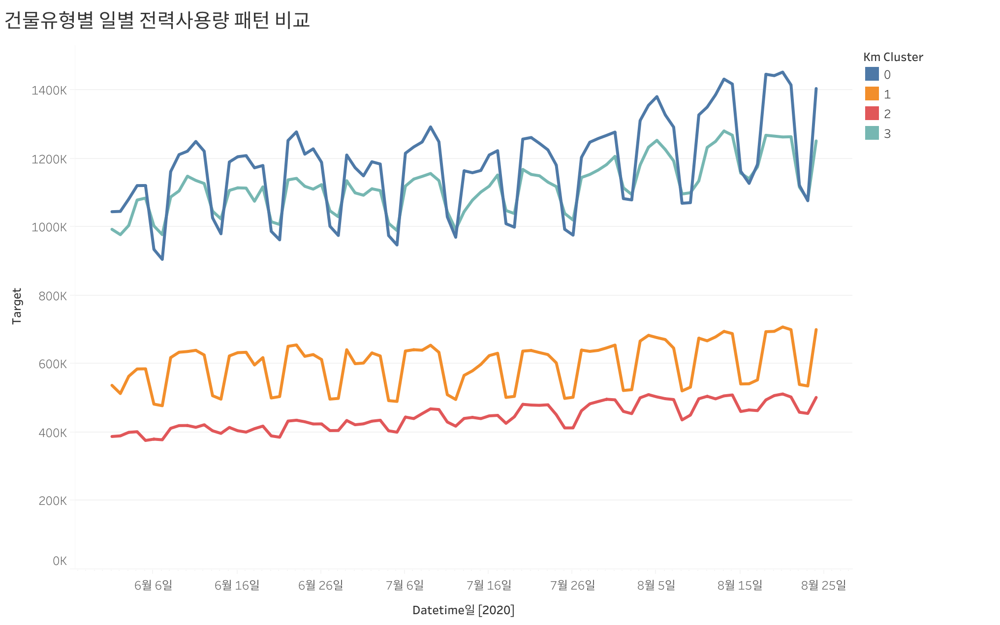

In [153]:
Image('Sheet 1 (6).png',width=1024)

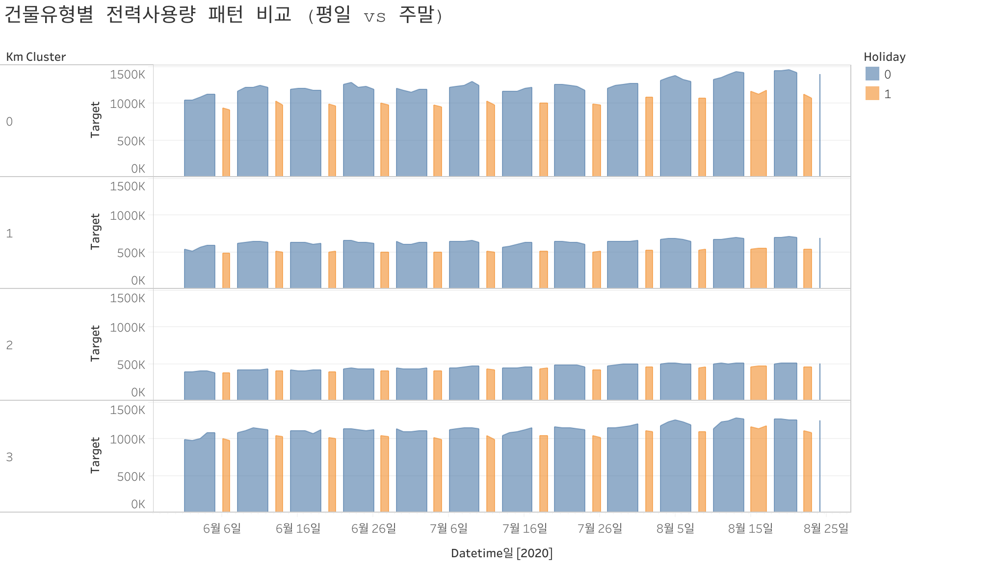

In [154]:
Image('Sheet 1 (7).png',width=1024)

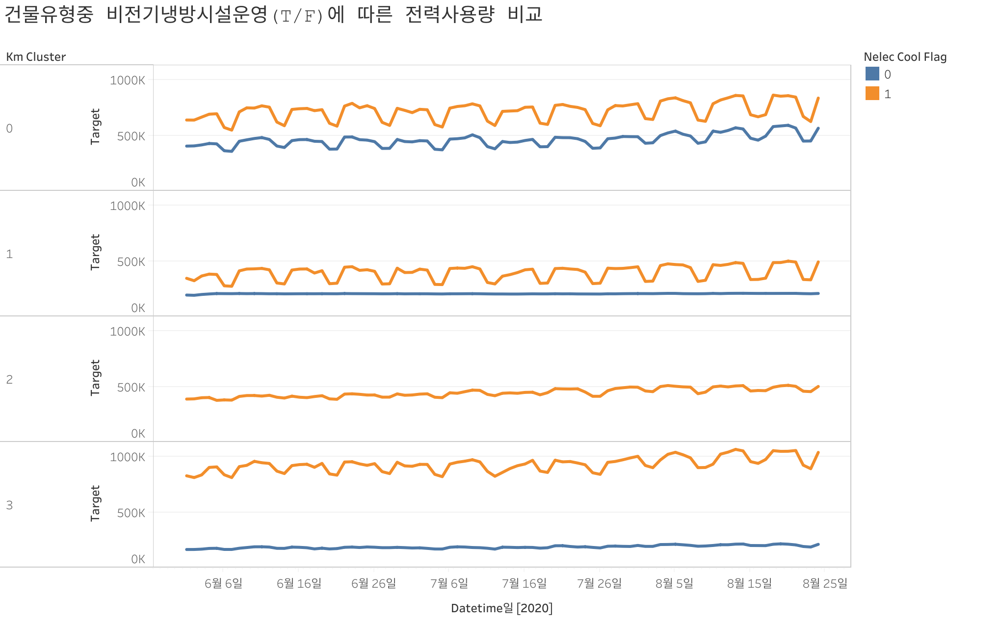

In [155]:
Image('Sheet 1 (8).png',width=1024)

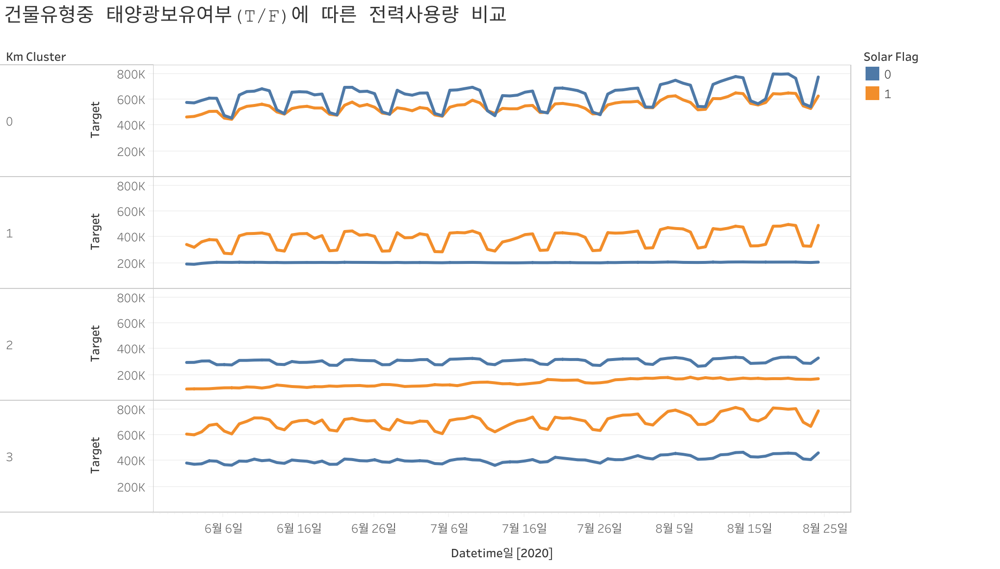

In [156]:
Image('Sheet 1 (9).png',width=1024)

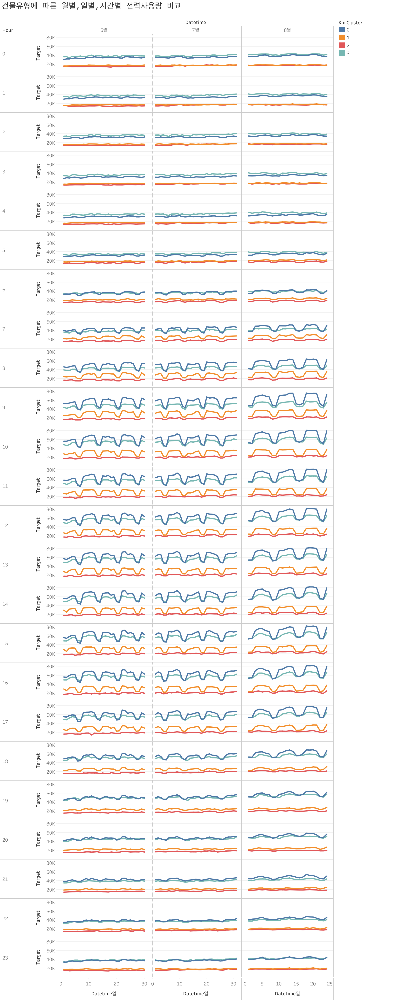

In [157]:
Image('Sheet 1 (10).png',width=1024)

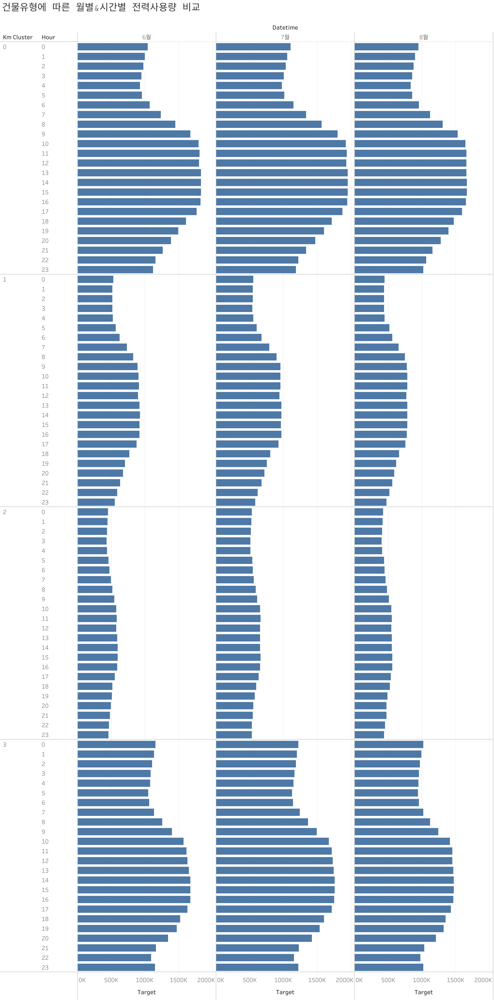

In [158]:
Image('Sheet 1 (11).png',width=1024)

### 잘못한 점
- 스케일링 안하면 군집화 제대로 안됨
- 이전에 target 평균 or 중앙값이 아닌 합계를 사용함

## 5. 코로나 거리두기 단계 컬럼 추가 - 수도권 가정
데이콘 [코로나 관련 컬럼 추가](https://dacon.io/competitions/official/235736/codeshare/2811?page=1&dtype=recent) 참조

## 5.1 클러스터 전 추가

In [161]:
train.head()

,num,date_time,target,temp,wind,humid,rain,sunny,cooler,solar,month,day,hour,weekday,dayofyear,holiday,weekend,date
0,1,2020-06-01 00:00:00,8179.056,17.6,2.5,92.0,0.8,0.0,0.0,0.0,6,1,0,0,153,0.0,0,2020-06-01
1,1,2020-06-01 01:00:00,8135.640,17.7,2.9,91.0,0.3,0.0,0.0,0.0,6,1,1,0,153,0.0,0,2020-06-01
2,1,2020-06-01 02:00:00,8107.128,17.5,3.2,91.0,0.0,0.0,0.0,0.0,6,1,2,0,153,0.0,0,2020-06-01
3,1,2020-06-01 03:00:00,8048.808,17.1,3.2,91.0,0.0,0.0,0.0,0.0,6,1,3,0,153,0.0,0,2020-06-01
4,1,2020-06-01 04:00:00,8043.624,17.0,3.3,92.0,0.0,0.0,0.0,0.0,6,1,4,0,153,0.0,0,2020-06-01


In [163]:
train_corona = train.copy()

In [164]:
train_corona = train_corona.astype({'holiday':'int','cooler':'int','solar':'int'})
train_corona.head()

,num,date_time,target,temp,wind,humid,rain,sunny,cooler,solar,month,day,hour,weekday,dayofyear,holiday,weekend,date
0,1,2020-06-01 00:00:00,8179.056,17.6,2.5,92.0,0.8,0.0,0,0,6,1,0,0,153,0,0,2020-06-01
1,1,2020-06-01 01:00:00,8135.640,17.7,2.9,91.0,0.3,0.0,0,0,6,1,1,0,153,0,0,2020-06-01
2,1,2020-06-01 02:00:00,8107.128,17.5,3.2,91.0,0.0,0.0,0,0,6,1,2,0,153,0,0,2020-06-01
3,1,2020-06-01 03:00:00,8048.808,17.1,3.2,91.0,0.0,0.0,0,0,6,1,3,0,153,0,0,2020-06-01
4,1,2020-06-01 04:00:00,8043.624,17.0,3.3,92.0,0.0,0.0,0,0,6,1,4,0,153,0,0,2020-06-01


In [165]:
month=np.array(train_corona.month)
day=np.array(train_corona.day)

corona=[]
for m,d in zip(month,day):
    if m==8 and d>=16:
        corona.append(2)
    else:
        corona.append(1)
        
train_corona['social_distance']=corona

train_corona.head(10)

,num,date_time,target,temp,wind,humid,rain,sunny,cooler,solar,month,day,hour,weekday,dayofyear,holiday,weekend,date,social_distance
0,1,2020-06-01 00:00:00,8179.056,17.6,2.5,92.0,0.8,0.0,0,0,6,1,0,0,153,0,0,2020-06-01,1
1,1,2020-06-01 01:00:00,8135.640,17.7,2.9,91.0,0.3,0.0,0,0,6,1,1,0,153,0,0,2020-06-01,1
2,1,2020-06-01 02:00:00,8107.128,17.5,3.2,91.0,0.0,0.0,0,0,6,1,2,0,153,0,0,2020-06-01,1
3,1,2020-06-01 03:00:00,8048.808,17.1,3.2,91.0,0.0,0.0,0,0,6,1,3,0,153,0,0,2020-06-01,1
4,1,2020-06-01 04:00:00,8043.624,17.0,3.3,92.0,0.0,0.0,0,0,6,1,4,0,153,0,0,2020-06-01,1
5,1,2020-06-01 05:00:00,8010.576,16.9,3.4,93.0,0.0,0.0,0,0,6,1,5,0,153,0,0,2020-06-01,1
6,1,2020-06-01 06:00:00,7978.176,16.7,3.4,90.0,0.1,0.0,0,0,6,1,6,0,153,0,0,2020-06-01,1
7,1,2020-06-01 07:00:00,8019.000,16.9,2.3,86.0,0.0,0.1,0,0,6,1,7,0,153,0,0,2020-06-01,1
8,1,2020-06-01 08:00:00,8020.944,17.8,3.3,80.0,0.0,0.3,0,0,6,1,8,0,153,0,0,2020-06-01,1
9,1,2020-06-01 09:00:00,8083.152,19.3,2.1,73.0,0.0,0.7,0,0,6,1,9,0,153,0,0,2020-06-01,1


In [166]:
train_corona.loc[(train_corona.month == 8) & (train_corona.day == 15)]

,num,date_time,target,temp,wind,humid,rain,sunny,cooler,solar,month,day,hour,weekday,dayofyear,holiday,weekend,date,social_distance
1800,1,2020-08-15 00:00:00,8718.192,26.5,2.8,92.0,0.0,0.0,0,0,8,15,0,5,228,1,1,2020-08-15,1
1801,1,2020-08-15 01:00:00,8694.216,26.5,2.3,92.0,0.0,0.0,0,0,8,15,1,5,228,1,1,2020-08-15,1
1802,1,2020-08-15 02:00:00,8705.232,26.3,2.6,93.0,0.0,0.0,0,0,8,15,2,5,228,1,1,2020-08-15,1
1803,1,2020-08-15 03:00:00,8701.344,25.8,3.5,96.0,10.8,0.0,0,0,8,15,3,5,228,1,1,2020-08-15,1
1804,1,2020-08-15 04:00:00,8658.576,25.8,2.6,96.0,0.5,0.0,0,0,8,15,4,5,228,1,1,2020-08-15,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122179,60,2020-08-15 19:00:00,4090.176,25.7,1.1,94.0,0.0,0.0,1,1,8,15,19,5,228,1,1,2020-08-15,1
122180,60,2020-08-15 20:00:00,4131.216,25.4,1.1,94.0,0.0,0.0,1,1,8,15,20,5,228,1,1,2020-08-15,1
122181,60,2020-08-15 21:00:00,4002.048,25.3,1.8,94.0,0.0,0.0,1,1,8,15,21,5,228,1,1,2020-08-15,1
122182,60,2020-08-15 22:00:00,3805.056,25.6,2.7,94.0,0.0,0.0,1,1,8,15,22,5,228,1,1,2020-08-15,1


In [167]:
train_corona.loc[(train_corona.month == 8) & (train_corona.day == 16)]

,num,date_time,target,temp,wind,humid,rain,sunny,cooler,solar,month,day,hour,weekday,dayofyear,holiday,weekend,date,social_distance
1824,1,2020-08-16 00:00:00,8706.528,26.5,1.2,94.0,0.0,0.0,0,0,8,16,0,6,229,1,1,2020-08-16,2
1825,1,2020-08-16 01:00:00,8680.608,26.2,1.7,94.0,0.0,0.0,0,0,8,16,1,6,229,1,1,2020-08-16,2
1826,1,2020-08-16 02:00:00,8661.816,25.9,2.5,93.0,0.0,0.0,0,0,8,16,2,6,229,1,1,2020-08-16,2
1827,1,2020-08-16 03:00:00,8632.656,25.6,3.4,91.0,0.0,0.0,0,0,8,16,3,6,229,1,1,2020-08-16,2
1828,1,2020-08-16 04:00:00,8600.904,25.5,2.7,91.0,0.0,0.0,0,0,8,16,4,6,229,1,1,2020-08-16,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122203,60,2020-08-16 19:00:00,4021.056,26.2,3.0,88.0,0.0,0.0,1,1,8,16,19,6,229,1,1,2020-08-16,2
122204,60,2020-08-16 20:00:00,3965.760,25.9,2.6,90.0,0.0,0.0,1,1,8,16,20,6,229,1,1,2020-08-16,2
122205,60,2020-08-16 21:00:00,3872.016,25.8,3.1,90.0,0.0,0.0,1,1,8,16,21,6,229,1,1,2020-08-16,2
122206,60,2020-08-16 22:00:00,3674.592,25.6,2.6,90.0,0.0,0.0,1,1,8,16,22,6,229,1,1,2020-08-16,2


In [168]:
train_corona.to_csv('train_corona.csv',index=False)

## 5.2 클러스터 후 추가
- target 스케일링 되어있음

In [170]:
train

,num,date_time,target,temp,wind,humid,rain,sunny,cooler,solar,month,day,hour,weekday,dayofyear,holiday,weekend,date
0,1,2020-06-01 00:00:00,8179.056,17.6,2.5,92.0,0.8,0.0,0.0,0.0,6,1,0,0,153,0.0,0,2020-06-01
1,1,2020-06-01 01:00:00,8135.640,17.7,2.9,91.0,0.3,0.0,0.0,0.0,6,1,1,0,153,0.0,0,2020-06-01
2,1,2020-06-01 02:00:00,8107.128,17.5,3.2,91.0,0.0,0.0,0.0,0.0,6,1,2,0,153,0.0,0,2020-06-01
3,1,2020-06-01 03:00:00,8048.808,17.1,3.2,91.0,0.0,0.0,0.0,0.0,6,1,3,0,153,0.0,0,2020-06-01
4,1,2020-06-01 04:00:00,8043.624,17.0,3.3,92.0,0.0,0.0,0.0,0.0,6,1,4,0,153,0.0,0,2020-06-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122395,60,2020-08-24 19:00:00,4114.368,27.8,2.3,68.0,0.0,0.7,1.0,1.0,8,24,19,0,237,0.0,0,2020-08-24
122396,60,2020-08-24 20:00:00,3975.696,27.3,1.2,71.0,0.0,0.0,1.0,1.0,8,24,20,0,237,0.0,0,2020-08-24
122397,60,2020-08-24 21:00:00,3572.208,27.3,1.8,71.0,0.0,0.0,1.0,1.0,8,24,21,0,237,0.0,0,2020-08-24
122398,60,2020-08-24 22:00:00,3299.184,27.1,1.8,74.0,0.0,0.0,1.0,1.0,8,24,22,0,237,0.0,0,2020-08-24


In [171]:
train_goo = train_cl.copy()

In [172]:
train_goo

,num,date_time,target,temp,wind,humid,rain,sunny,cooler,solar,month,day,hour,weekday,dayofyear,holiday,weekend,date,km_cluster
0,1,2020-06-01 00:00:00,-2.795969,17.6,2.5,92.0,0.8,0.0,0,0,6,1,0,0,153,0,0,2020-06-01,1
1,1,2020-06-01 01:00:00,-3.129259,17.7,2.9,91.0,0.3,0.0,0,0,6,1,1,0,153,0,0,2020-06-01,1
2,1,2020-06-01 02:00:00,-3.348135,17.5,3.2,91.0,0.0,0.0,0,0,6,1,2,0,153,0,0,2020-06-01,1
3,1,2020-06-01 03:00:00,-3.795838,17.1,3.2,91.0,0.0,0.0,0,0,6,1,3,0,153,0,0,2020-06-01,1
4,1,2020-06-01 04:00:00,-3.835633,17.0,3.3,92.0,0.0,0.0,0,0,6,1,4,0,153,0,0,2020-06-01,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122395,60,2020-08-24 19:00:00,1.840746,27.8,2.3,68.0,0.0,0.7,1,1,8,24,19,0,237,0,0,2020-08-24,2
122396,60,2020-08-24 20:00:00,1.504699,27.3,1.2,71.0,0.0,0.0,1,1,8,24,20,0,237,0,0,2020-08-24,2
122397,60,2020-08-24 21:00:00,0.526918,27.3,1.8,71.0,0.0,0.0,1,1,8,24,21,0,237,0,0,2020-08-24,2
122398,60,2020-08-24 22:00:00,-0.134708,27.1,1.8,74.0,0.0,0.0,1,1,8,24,22,0,237,0,0,2020-08-24,2


In [174]:
train_target = train.loc[:,['target']]

In [175]:
train_target

,target
0,8179.056
1,8135.640
2,8107.128
3,8048.808
4,8043.624
...,...
122395,4114.368
122396,3975.696
122397,3572.208
122398,3299.184


In [176]:
train_target.columns = ['Target']

In [177]:
train_cl_final = pd.concat([train_goo,train_target], axis=1)

In [178]:
train_cl_final

,num,date_time,target,temp,wind,humid,rain,sunny,cooler,solar,month,day,hour,weekday,dayofyear,holiday,weekend,date,km_cluster,Target
0,1,2020-06-01 00:00:00,-2.795969,17.6,2.5,92.0,0.8,0.0,0,0,6,1,0,0,153,0,0,2020-06-01,1,8179.056
1,1,2020-06-01 01:00:00,-3.129259,17.7,2.9,91.0,0.3,0.0,0,0,6,1,1,0,153,0,0,2020-06-01,1,8135.640
2,1,2020-06-01 02:00:00,-3.348135,17.5,3.2,91.0,0.0,0.0,0,0,6,1,2,0,153,0,0,2020-06-01,1,8107.128
3,1,2020-06-01 03:00:00,-3.795838,17.1,3.2,91.0,0.0,0.0,0,0,6,1,3,0,153,0,0,2020-06-01,1,8048.808
4,1,2020-06-01 04:00:00,-3.835633,17.0,3.3,92.0,0.0,0.0,0,0,6,1,4,0,153,0,0,2020-06-01,1,8043.624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122395,60,2020-08-24 19:00:00,1.840746,27.8,2.3,68.0,0.0,0.7,1,1,8,24,19,0,237,0,0,2020-08-24,2,4114.368
122396,60,2020-08-24 20:00:00,1.504699,27.3,1.2,71.0,0.0,0.0,1,1,8,24,20,0,237,0,0,2020-08-24,2,3975.696
122397,60,2020-08-24 21:00:00,0.526918,27.3,1.8,71.0,0.0,0.0,1,1,8,24,21,0,237,0,0,2020-08-24,2,3572.208
122398,60,2020-08-24 22:00:00,-0.134708,27.1,1.8,74.0,0.0,0.0,1,1,8,24,22,0,237,0,0,2020-08-24,2,3299.184


In [181]:
train_cl_final  = train_cl_final[['num', 'date_time', 'Target', 'cooler','solar','hour','day','month','holiday','km_cluster']]

In [182]:
train_cl_final

,num,date_time,Target,cooler,solar,hour,day,month,holiday,km_cluster
0,1,2020-06-01 00:00:00,8179.056,0,0,0,1,6,0,1
1,1,2020-06-01 01:00:00,8135.640,0,0,1,1,6,0,1
2,1,2020-06-01 02:00:00,8107.128,0,0,2,1,6,0,1
3,1,2020-06-01 03:00:00,8048.808,0,0,3,1,6,0,1
4,1,2020-06-01 04:00:00,8043.624,0,0,4,1,6,0,1
...,...,...,...,...,...,...,...,...,...,...
122395,60,2020-08-24 19:00:00,4114.368,1,1,19,24,8,0,2
122396,60,2020-08-24 20:00:00,3975.696,1,1,20,24,8,0,2
122397,60,2020-08-24 21:00:00,3572.208,1,1,21,24,8,0,2
122398,60,2020-08-24 22:00:00,3299.184,1,1,22,24,8,0,2


In [183]:
train_cl_final  = train_cl_final.rename(columns={'Target': 'target'})

In [184]:
train_cl_final

,num,date_time,target,cooler,solar,hour,day,month,holiday,km_cluster
0,1,2020-06-01 00:00:00,8179.056,0,0,0,1,6,0,1
1,1,2020-06-01 01:00:00,8135.640,0,0,1,1,6,0,1
2,1,2020-06-01 02:00:00,8107.128,0,0,2,1,6,0,1
3,1,2020-06-01 03:00:00,8048.808,0,0,3,1,6,0,1
4,1,2020-06-01 04:00:00,8043.624,0,0,4,1,6,0,1
...,...,...,...,...,...,...,...,...,...,...
122395,60,2020-08-24 19:00:00,4114.368,1,1,19,24,8,0,2
122396,60,2020-08-24 20:00:00,3975.696,1,1,20,24,8,0,2
122397,60,2020-08-24 21:00:00,3572.208,1,1,21,24,8,0,2
122398,60,2020-08-24 22:00:00,3299.184,1,1,22,24,8,0,2


In [185]:
month=np.array(train_cl_final.month)
day=np.array(train_cl_final.day)

corona=[]
for m,d in zip(month,day):
    if m==8 and d>=16:
        corona.append(2)
    else:
        corona.append(1)
        
train_cl_final['social_distance']=corona

train_cl_final.head(10)

,num,date_time,target,cooler,solar,hour,day,month,holiday,km_cluster,social_distance
0,1,2020-06-01 00:00:00,8179.056,0,0,0,1,6,0,1,1
1,1,2020-06-01 01:00:00,8135.640,0,0,1,1,6,0,1,1
2,1,2020-06-01 02:00:00,8107.128,0,0,2,1,6,0,1,1
3,1,2020-06-01 03:00:00,8048.808,0,0,3,1,6,0,1,1
4,1,2020-06-01 04:00:00,8043.624,0,0,4,1,6,0,1,1
5,1,2020-06-01 05:00:00,8010.576,0,0,5,1,6,0,1,1
6,1,2020-06-01 06:00:00,7978.176,0,0,6,1,6,0,1,1
7,1,2020-06-01 07:00:00,8019.000,0,0,7,1,6,0,1,1
8,1,2020-06-01 08:00:00,8020.944,0,0,8,1,6,0,1,1
9,1,2020-06-01 09:00:00,8083.152,0,0,9,1,6,0,1,1


In [186]:
train_cl_final.loc[(train_corona.month == 8) & (train_corona.day == 15)]

,num,date_time,target,cooler,solar,hour,day,month,holiday,km_cluster,social_distance
1800,1,2020-08-15 00:00:00,8718.192,0,0,0,15,8,1,1,1
1801,1,2020-08-15 01:00:00,8694.216,0,0,1,15,8,1,1,1
1802,1,2020-08-15 02:00:00,8705.232,0,0,2,15,8,1,1,1
1803,1,2020-08-15 03:00:00,8701.344,0,0,3,15,8,1,1,1
1804,1,2020-08-15 04:00:00,8658.576,0,0,4,15,8,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...
122179,60,2020-08-15 19:00:00,4090.176,1,1,19,15,8,1,2,1
122180,60,2020-08-15 20:00:00,4131.216,1,1,20,15,8,1,2,1
122181,60,2020-08-15 21:00:00,4002.048,1,1,21,15,8,1,2,1
122182,60,2020-08-15 22:00:00,3805.056,1,1,22,15,8,1,2,1


In [187]:
train_cl_final.loc[(train_corona.month == 8) & (train_corona.day == 16)]

,num,date_time,target,cooler,solar,hour,day,month,holiday,km_cluster,social_distance
1824,1,2020-08-16 00:00:00,8706.528,0,0,0,16,8,1,1,2
1825,1,2020-08-16 01:00:00,8680.608,0,0,1,16,8,1,1,2
1826,1,2020-08-16 02:00:00,8661.816,0,0,2,16,8,1,1,2
1827,1,2020-08-16 03:00:00,8632.656,0,0,3,16,8,1,1,2
1828,1,2020-08-16 04:00:00,8600.904,0,0,4,16,8,1,1,2
...,...,...,...,...,...,...,...,...,...,...,...
122203,60,2020-08-16 19:00:00,4021.056,1,1,19,16,8,1,2,2
122204,60,2020-08-16 20:00:00,3965.760,1,1,20,16,8,1,2,2
122205,60,2020-08-16 21:00:00,3872.016,1,1,21,16,8,1,2,2
122206,60,2020-08-16 22:00:00,3674.592,1,1,22,16,8,1,2,2


In [196]:
train_cl_final.to_csv('train_cl_final.csv',index=False)

## 6. 위에꺼 버리고 다시 시각화
- 위에서 타겟 합계로 잘못 시각화함

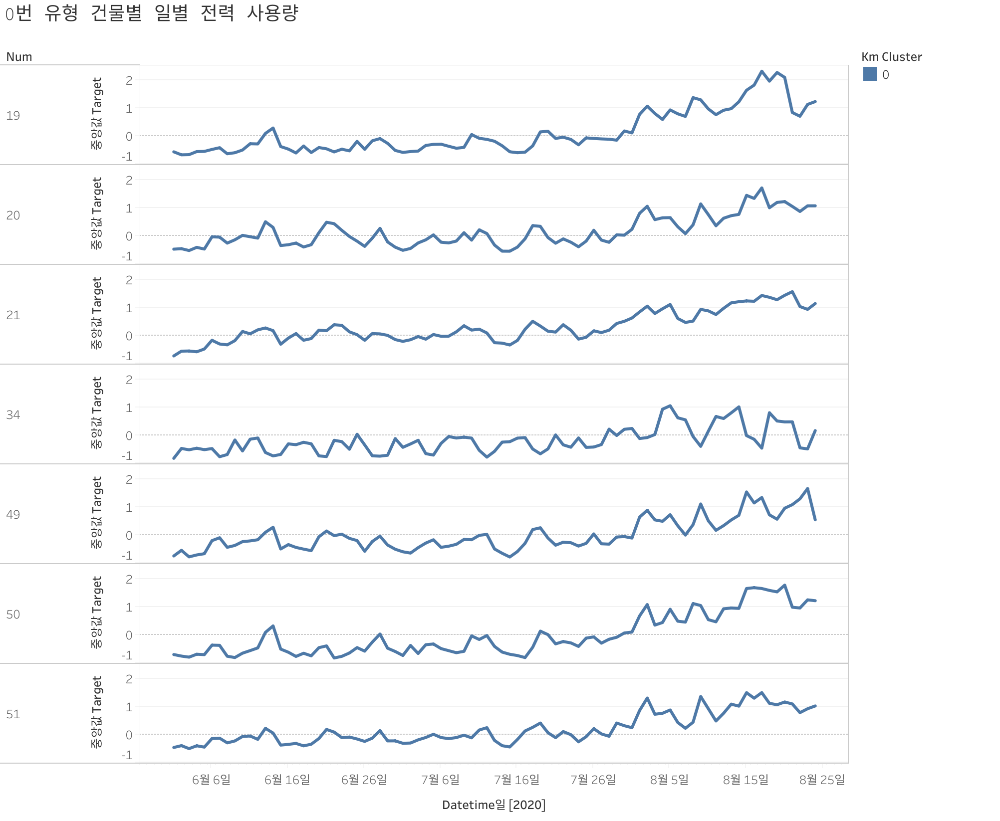

In [217]:
Image('시트 2 (5).png', width=1024)

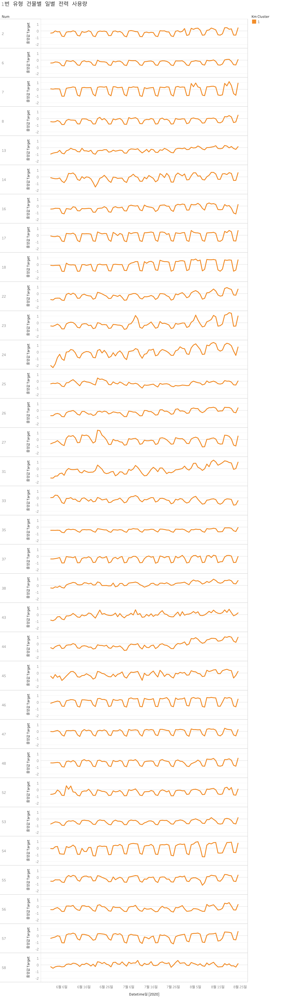

In [219]:
Image('시트 2 (6).png', width=1024)

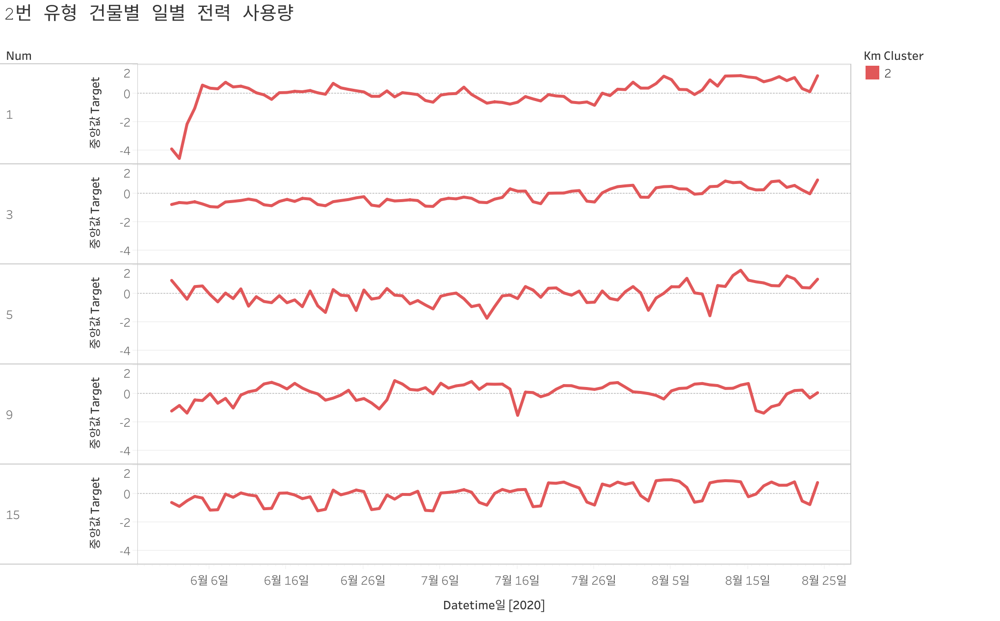

In [220]:
Image('시트 2 (7).png', width=1024)

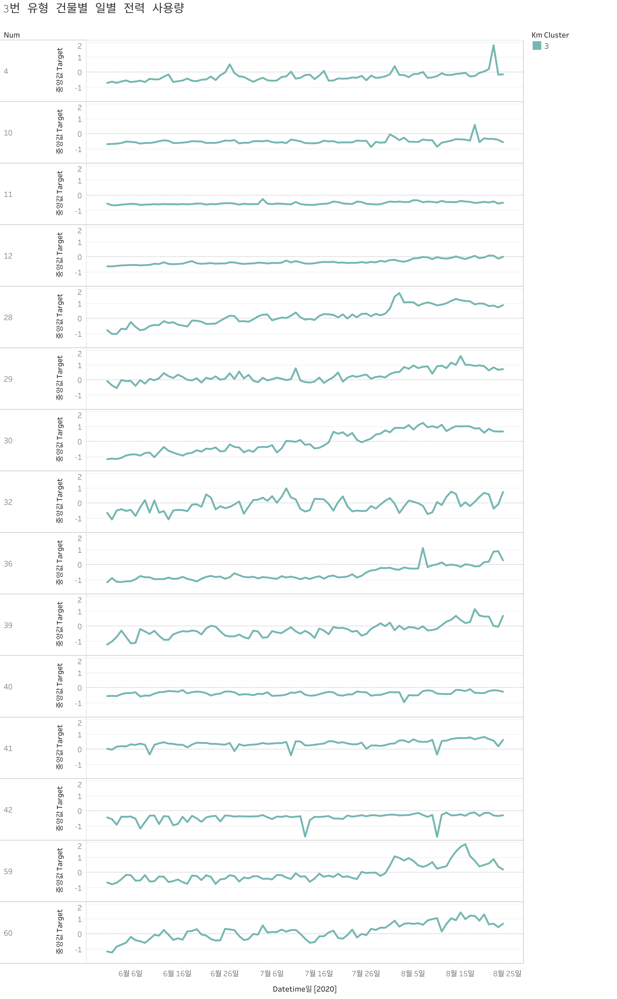

In [221]:
Image('시트 2 (8).png', width=1024)

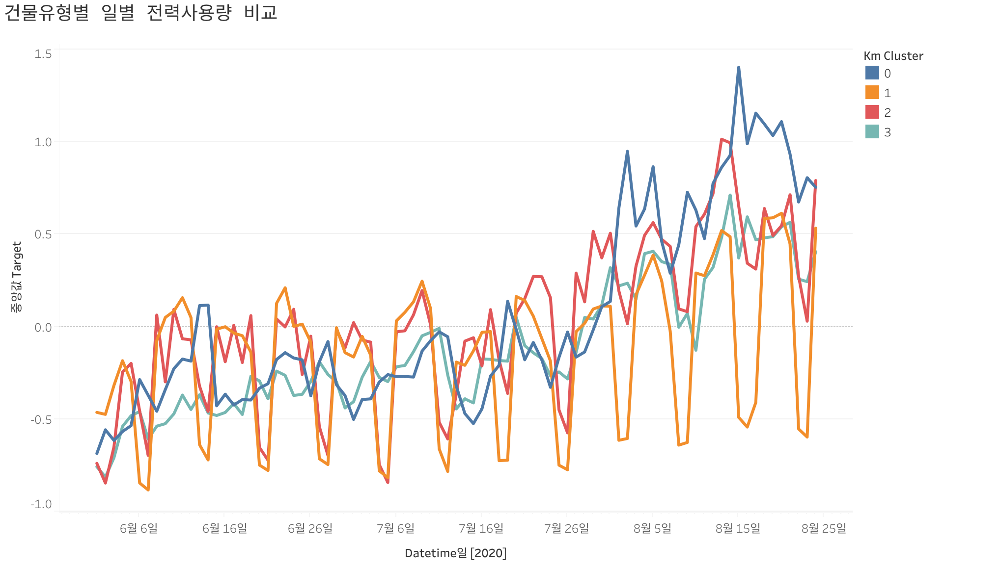

In [222]:
Image('시트 2 (2).png', width=1024)

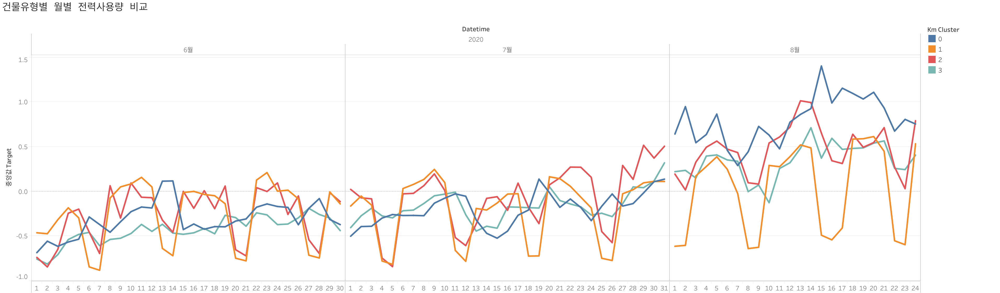

In [223]:
Image('시트 2 (3).png',width=1500)

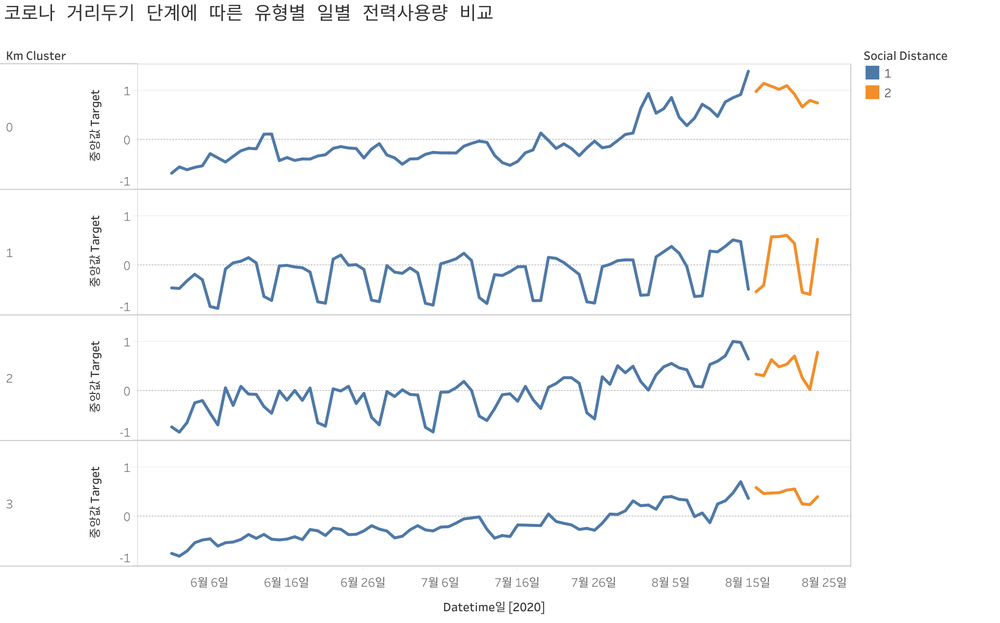

In [206]:
Image('Sheet 1 (12).png',width=1024)

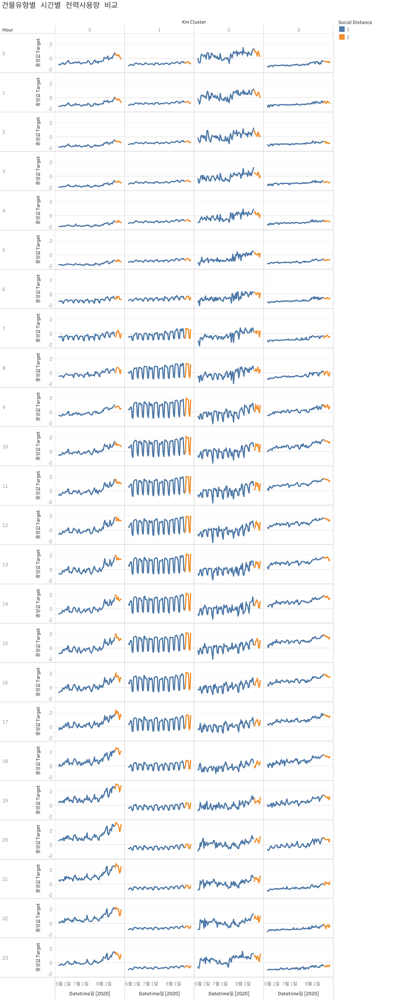

In [207]:
Image('시트 2 (4).png',width=1024)

### 스케일 전 target 값 과 타겟 중앙값으로 시각화하자!
- 위에서 타겟 합계로 잘못 시각화함

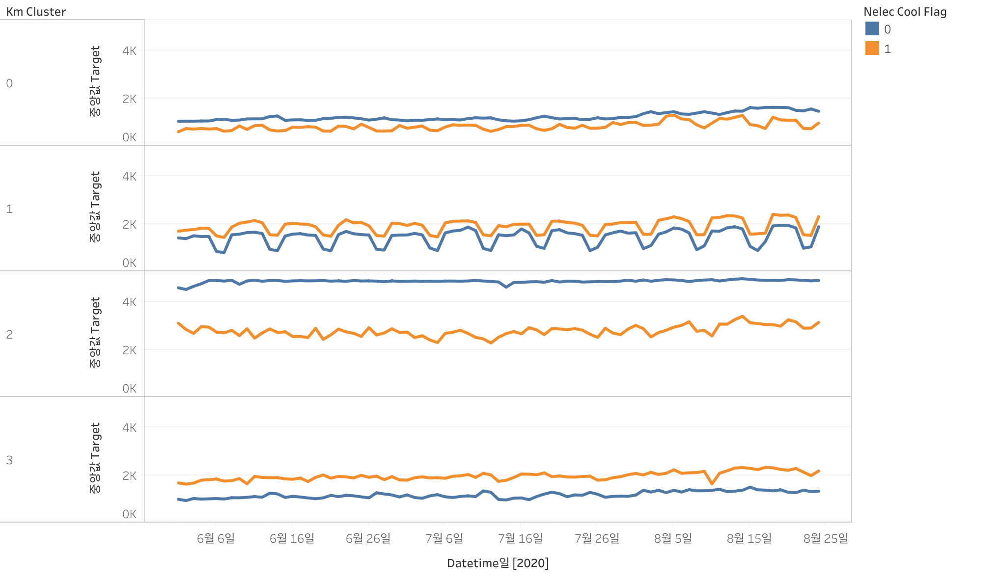

In [208]:
Image('Sheet 1 (14).png',width=1024)

# 7. target 스케일링 전 값으로 시각화

In [209]:
### 군집화 후 비전기운영시설 여부에 따른 일별 전력사용량 비교

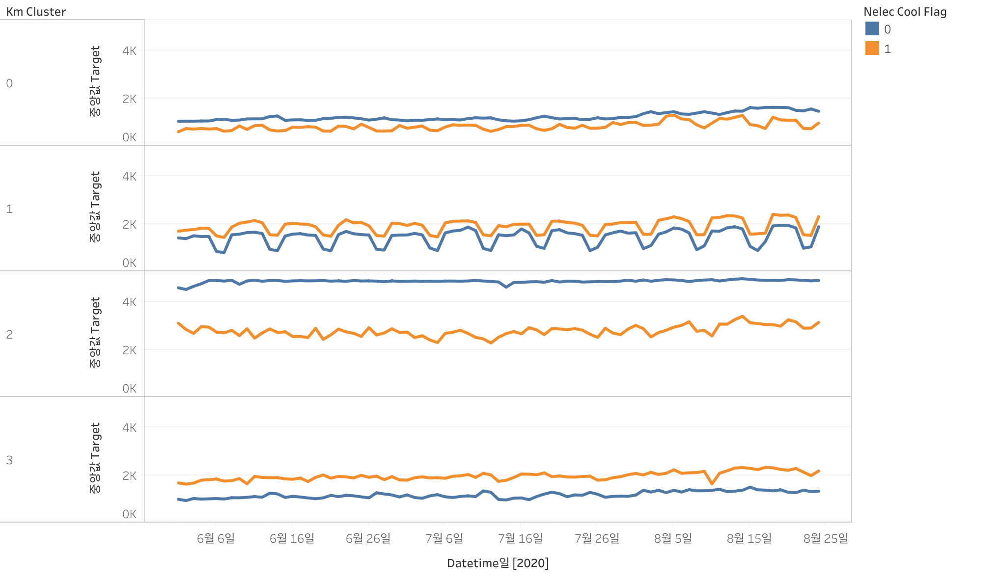

In [210]:
Image('Sheet 1 (14).png',width=1024)

## 기후변수 및 태양광 보유 변수

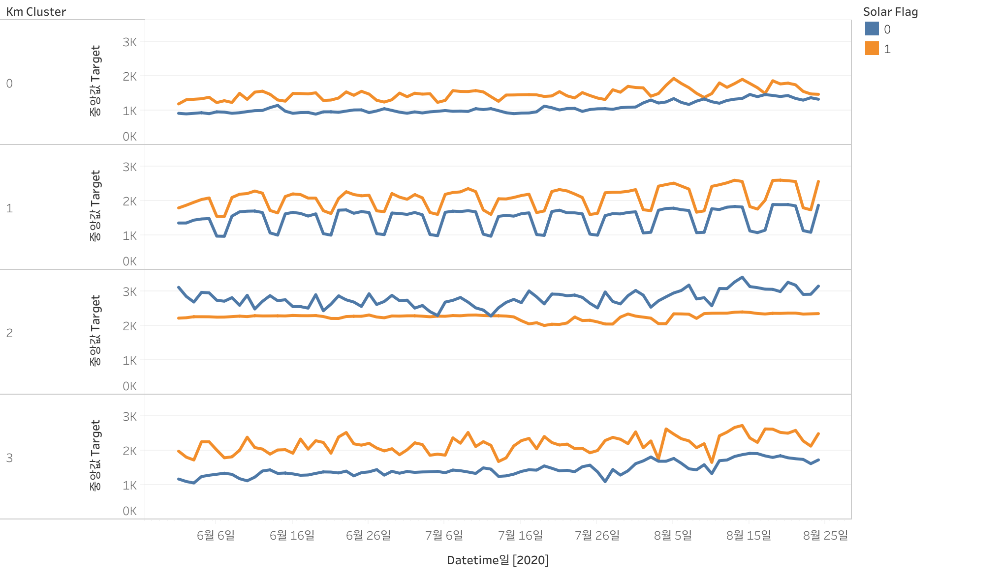

In [211]:
Image('Sheet 1 (13).png',width=1024)

In [212]:
### 군집화 후 건물 유형에 따른 일별 전력사용량 비교

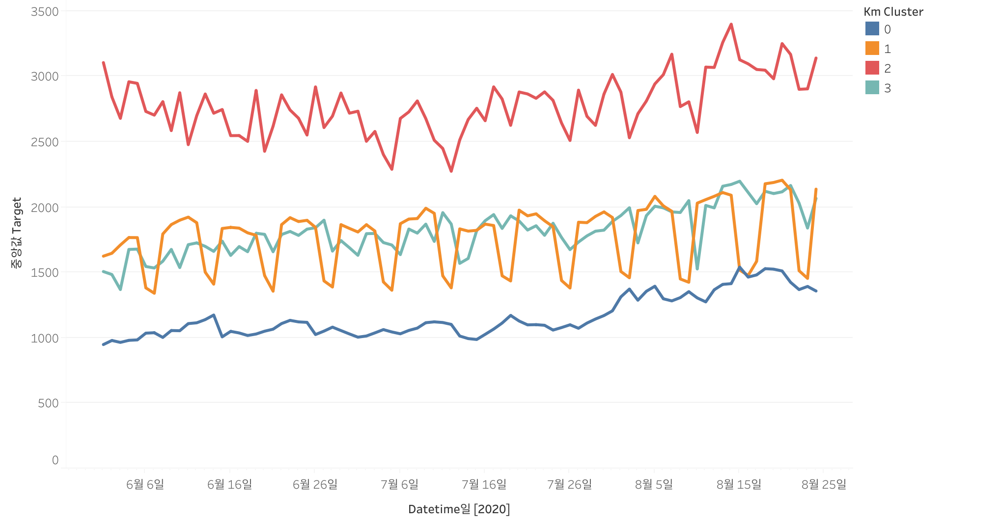

In [213]:
Image('Sheet 1 (15).png',width=1024)

### 각 변수의 날짜별 추이

In [214]:
Image('/Users/kyungmo/Desktop/energy/dash2.png')

FileNotFoundError: No such file or directory: '/Users/kyungmo/Desktop/energy/dash2.png'

FileNotFoundError: No such file or directory: '/Users/kyungmo/Desktop/energy/dash2.png'

<IPython.core.display.Image object>

* 평균 기온: 날짜가 지날수록 증가하는 추세
* 강수량: 7월에 강수량이 유독 많음(장마철)
* 평균 일조: 6월과 8월 중순 이후에 일조량이 높음
* 평균 풍속: 뚜렷한 추세 없이 들쭉날쭉함
* 평균 습도: 날짜가 지날수록 증가하는 추세

### 각 변수와 전력사용량 사이의 관계

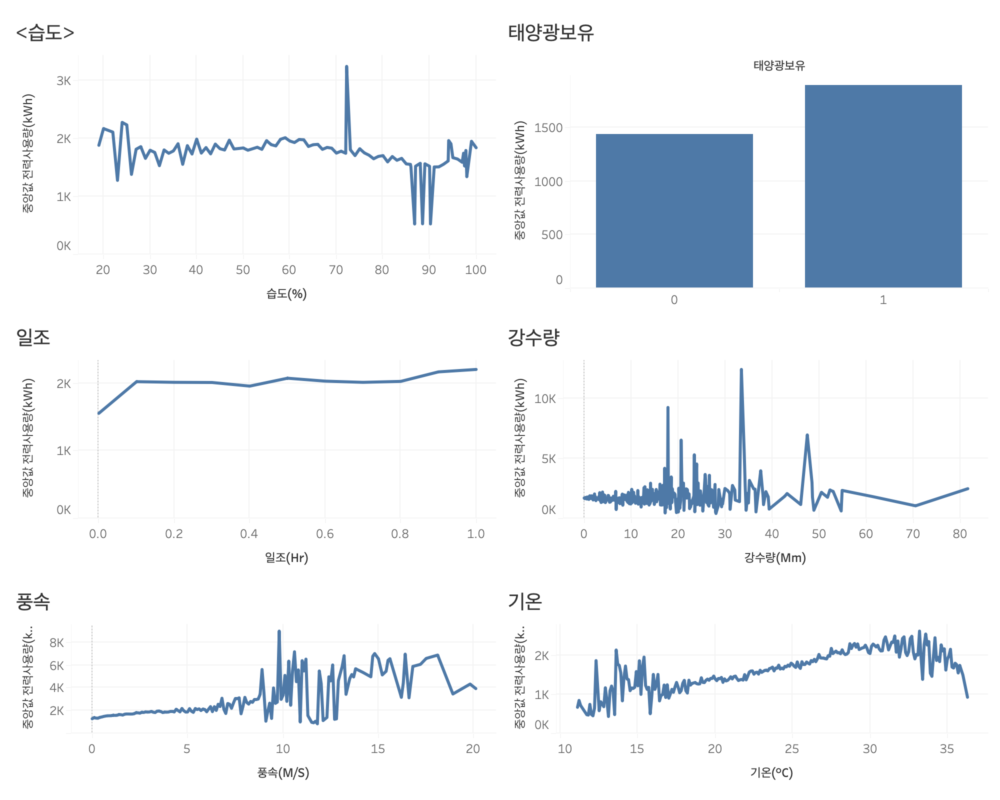

In [369]:
Image('/Users/kyungmo/Desktop/energy/dash.png')

다양한 변수들 중, 전력사용량과 뚜렷한 관계를 보이는 변수는 다음과 같다.
* 태양광 보유 : 태양광발전을 보유한 건물의 전력사용량이 조금 더 높다.
* 일조: 일조가 매우 낮을때는 전력 사용량이 낮아지며, 일조가 매우 높을때는 전력사용량이 높다.
* 풍속: 풍속이 높아질수록 대체적으로 전력 사용량이 높아진다. 
* 기온: 기온이 높아질수록 대체적으로 전력 사용량이 높아진다.

**위 시각화 에서의 의문점은 '기온'이다. 기온이 34도 이상이면 매우 무더운 날씨기 때문에 에어컨의 영향으로 전력 사용량이 증가할 것이라고 생각했는데, 왜 오히려 전력 사용량이 감소할까?**

In [370]:
temp_up_35 = train[train['temp']>35]

In [371]:
pivot = temp_up_35.pivot_table(index = 'weekday', columns='hour', values='target', aggfunc='median')

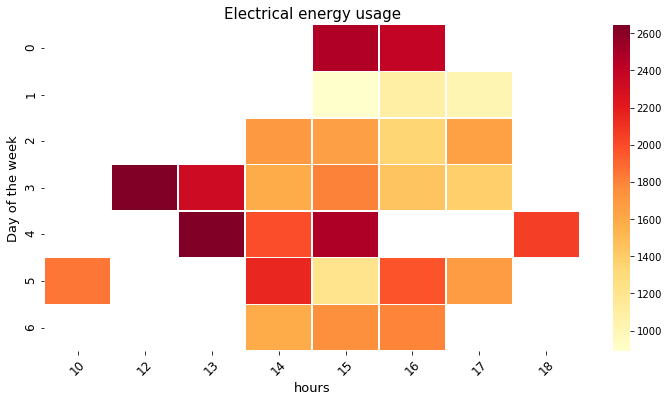

In [372]:
fig, ax = plt.subplots(figsize=(12,6))

sns.heatmap(pivot, 
            annot = False, 
            ax = ax, 
            linewidths = 0.4, 
            linecolor = 'white', 
            cmap = 'YlOrRd') 

plt.title('Electrical energy usage', size = 15)
plt.ylabel('Day of the week', size = 13)
plt.xlabel('hours', size = 13) 

plt.xticks(rotation=45, size = 12)
plt.yticks(size=12) 
plt.show()


본래 예상은 35도 이상 시간일때, 사람들의 활동시간대가 지난 데이터가 많이 들어갔기 때문에 전력사용량이 낮을 것이라고 예측하였지만, 위 히트맵중 전력 사용량이 가장 낮은 시간대는 오히려 가장 더울 시간대인 14시 사이였다.

그렇다면 기온 35도 이상 데이터의 상관계수를 확인해보자.


In [373]:
cols = temp_up_35.columns
corr = temp_up_35[cols].corr(method = 'pearson')
corr

,num,전력사용량(kWh),기온(°C),풍속(m/s),습도(%),강수량(mm),일조(hr),비전기냉방설비운영,태양광보유,월,주,일,시각,요일
num,1.000000,0.192992,-0.286052,-0.037075,-0.357647,NaN,0.231235,-0.083792,-0.317495,-0.462740,-0.405701,0.522594,0.113865,-0.513535
전력사용량(kWh),0.192992,1.000000,-0.252541,0.133246,-0.236265,NaN,0.095409,-0.058367,-0.089141,-0.330217,-0.298424,0.340937,0.000434,-0.301198
기온(°C),-0.286052,-0.252541,1.000000,-0.193253,0.110400,NaN,0.048363,0.227716,0.260738,0.285136,0.236661,-0.446614,-0.207353,0.263019
풍속(m/s),-0.037075,0.133246,-0.193253,1.000000,0.011318,NaN,0.060606,0.042353,0.133798,-0.082240,-0.106125,-0.106453,-0.186653,0.006020
습도(%),-0.357647,-0.236265,0.110400,0.011318,1.000000,NaN,-0.205991,0.098297,0.266308,0.869909,0.837665,-0.510862,-0.257380,0.814437
강수량(mm),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
일조(hr),0.231235,0.095409,0.048363,0.060606,-0.205991,NaN,1.000000,-0.125917,-0.170752,-0.103355,-0.045613,0.340250,-0.031180,-0.322382
비전기냉방설비운영,-0.083792,-0.058367,0.227716,0.042353,0.098297,NaN,-0.125917,1.000000,0.196125,0.223560,0.201157,-0.247456,-0.092418,0.183821
태양광보유,-0.317495,-0.089141,0.260738,0.133798,0.266308,NaN,-0.170752,0.196125,1.000000,0.320934,0.273912,-0.408760,-0.150684,0.372411
월,-0.462740,-0.330217,0.285136,-0.082240,0.869909,NaN,-0.103355,0.223560,0.320934,1.000000,0.989248,-0.446001,-0.204181,0.835561


기온보다 상관계수가 높은 column은 날짜 데이터밖에 없다는것을 확인할 수 있었다. 따라서 기온이 35도 이상일때 전력 사용량이 낮은 원인은 데이터의 특성과는 관련이 적다는 것을 알 수 있다.

## 태양광 보유 변수

**태양광 보유 변수는 범주형 변수(0,1)이기 때문에, 단독으로 사용하기 보다는 다른 변수들과 조합하여 사용하는것이 효과적일 것이다. 태양광에 영향을 미치는 변수인 강수량과 습도, 일조, 풍속 특성을 조합해보자**

**강수량과 습도는 낮을수록 태양광 발전이 잘되고, 풍속과 일조는 높을수록 잘되는 특성을 지닌다. 따라서 강수량과 습도는 분모에, 풍속과 일조는 분자에 대입하여 새로운 변수를 생성하여 전력 사용량과의 관계를 살펴보자.**

In [379]:
train.loc[data['solar'] == 1, '태양광보유계산'] = 0
train.loc[data['solar'] == 0, '태양광보유계산'] = 1

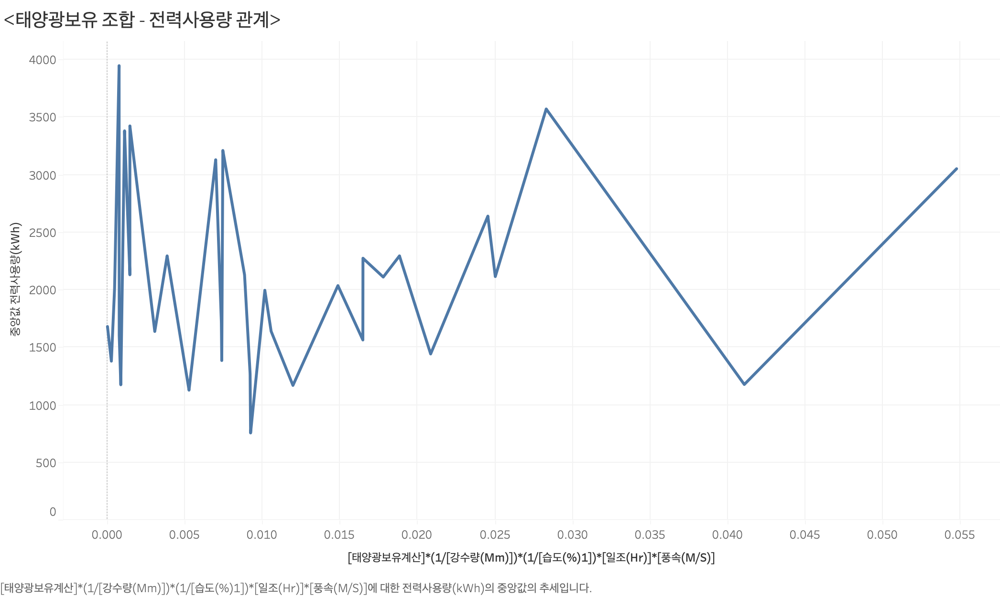

In [382]:
Image('/Users/kyungmo/Desktop/energy/sun2.png')

**조합하여 만든 새로운 변수가 낮을 값을 가질수록 태양광 발전이 잘 되지 않는 기후라는 뜻이며, 이때에는 전력 사용량이 증가할것이라고 예측할 수 있다.**
**계산결과가 0.02 이하에서는 예측한 것처럼 계산결과가 낮은 값을 가질때 전력사용량이 높음을 알 수 있지만, 그 이후부터는 추세가 일정하지 않음을 시각화를 통해 확인할 수 있다.**

## 불쾌지수

**불쾌지수는 1.8x기온–0.55x(1–습도)x(1.8x기온–26)+32로 계산되며, 불쾌지수가 높을수록 전력사용량이 높을 것이라고 예측할 수 있다. 이를 시각화를 통해 확인해보자.**

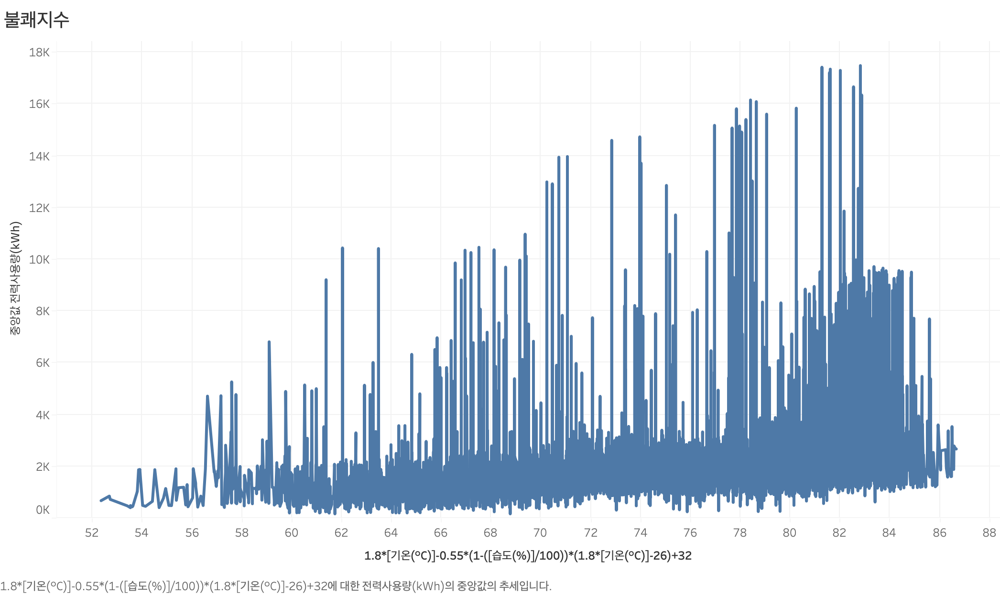

In [308]:
Image('/Users/kyungmo/Desktop/energy/angry.png')

**시각화를 통해 예측한대로 불쾌지수가 높을수록 전력 사용량이 증가함을 확인할 수 있다.**

#### 이번에는 불쾌지수를 구간화시켜, 전력사용량과의 관계를 heatmap으로 나타내보자.

In [310]:
train['불쾌지수'] = 1.8*train['temp'] - 0.55*(1-(train['humid']/100))*(1.8*train['temp']-26) + 32


In [317]:
def angry(x:float)->int:
    if x >= 80:
        return 1
    elif (x >= 75) & (x < 80) :
        return 2
    elif (x >= 68) & (x < 75) :
        return 3
    elif x < 68:
        return 4
    
train['불쾌지수구간'] = train['불쾌지수'].apply(angry)

In [318]:
pivot_angry = train.pivot_table(index='불쾌지수구간', values='target', aggfunc='median')


/Users/kyungmo/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 51204 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/kyungmo/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 47141 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/kyungmo/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 49324 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/kyungmo/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 50857 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/kyungmo/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 47049 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/kyungmo/opt/anaconda3/lib/python3.8/site-package

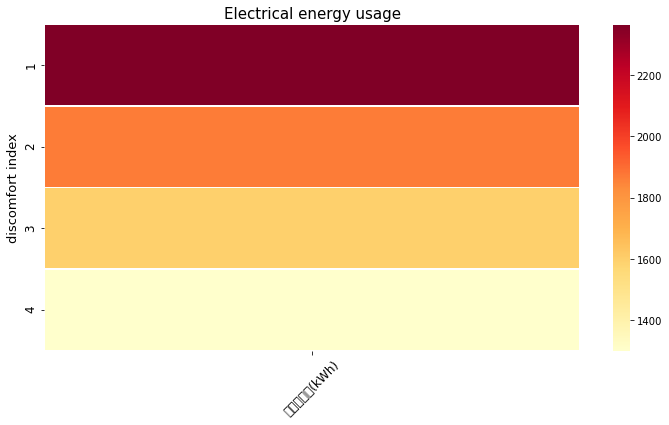

In [319]:
fig, ax = plt.subplots(figsize=(12,6))

sns.heatmap(pivot_angry, 
            annot = False, 
            ax = ax, 
            linewidths = 0.4, 
            linecolor = 'white', 
            cmap = 'YlOrRd') 

plt.title('Electrical energy usage', size = 15)
plt.ylabel('discomfort index', size = 13)


plt.xticks(rotation=45, size = 12)
plt.yticks(size=12) 
plt.show()


위에서 확인한것과 같이 불쾌지수가 높을수록 전력사용량이 높음을 알 수 있다.

## 체감온도

**체감온도는 불쾌지수에서 고려하지 않은 풍속 변수를 고려하여 계산된다.**
**체감온도(℃)=13.12+0.6215×T-11.37V0.16+0.3965V0.16×T이다. 여기서 T는 기온을 나타내며, V는 지상 10m 지점에서의 풍속을 의미한다.**

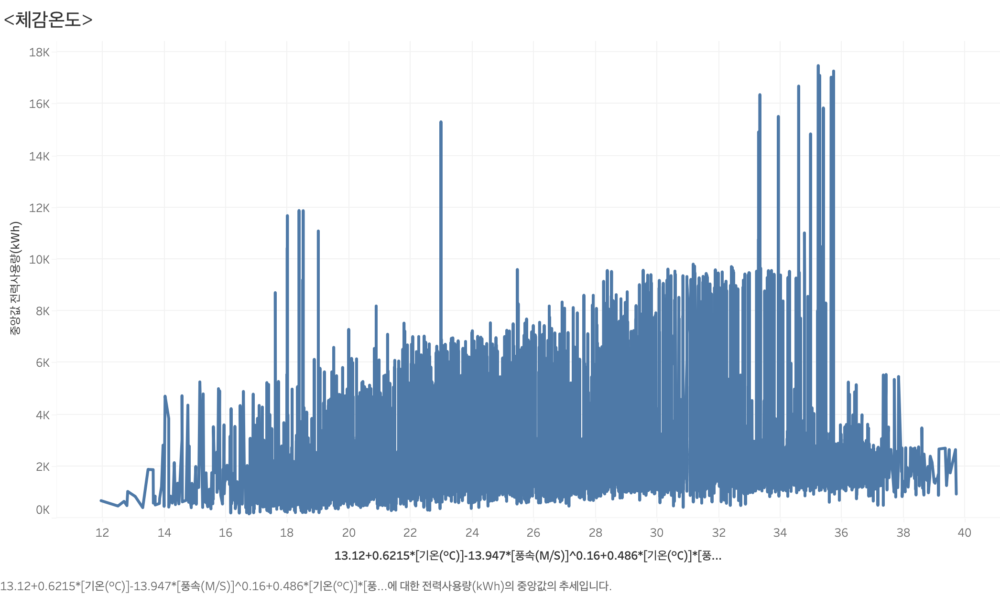

In [320]:
Image('/Users/kyungmo/Desktop/energy/temp.png')

**시각화를 통해 예측한대로 대체적으로 체감온도가 높을수록 전력 사용량이 증가함을 확인할 수 있다.**
**하지만 체감온도가 36도 이상부터는 오히려 전력 사용량이 감소하였다. 이는 체감온도가 아닌 기온 컬럼과의 관계에서도 확인해봤던 사항이다.**

**이번에는 불쾌지수를 구간화시켜, 전력사용량과의 관계를 heatmap으로 나타내보자.**

In [321]:
train['체감온도']=13.12+0.6215*train['temp']-13.947*train['wind']**0.16+0.486*train['temp']*train['wind']**0.16


In [322]:
def wct(x:float)->int:
    if x >= 37:
        return 1
    elif (x >= 34) & (x < 37):
        return 2
    elif (x >= 31) & (x < 34):
        return 3
    elif (x >= 29) & (x < 31):
        return 4
    elif x < 29:
        return 5
    
train['체감온도구간'] = train['체감온도'].apply(wct)

In [324]:
pivot_wct = train.pivot_table(index='체감온도구간', values='target', aggfunc='median')


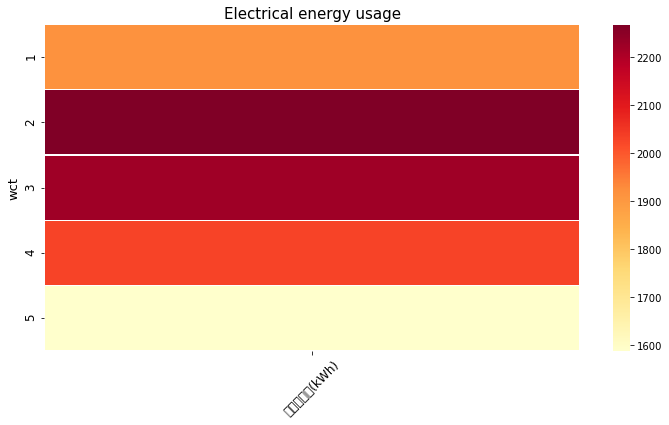

In [326]:
fig, ax = plt.subplots(figsize=(12,6))

sns.heatmap(pivot_wct, 
            annot = False, 
            ax = ax, 
            linewidths = 0.4, 
            linecolor = 'white', 
            cmap = 'YlOrRd') 

plt.title('Electrical energy usage', size = 15)
plt.ylabel('wct', size = 13)


plt.xticks(rotation=45, size = 12)
plt.yticks(size=12) 
plt.show()


**위의 시각화에서 확인한대로 체감온도가 높을수록 전력사용량은 증가하지만, 체감온도가 가장 높은 구간 구간에서는 오히려 전력사용량이 낮았음을 확인할 수 있다.**

## 군집화

### 기후 변수에 따른 건물 군집화를 통해 인사이트를 얻어보자.

In [327]:
cols = train.columns
corr = train[cols].corr(method = 'pearson')
corr

,num,전력사용량(kWh),기온(°C),풍속(m/s),습도(%),강수량(mm),일조(hr),비전기냉방설비운영,태양광보유,월,주,일,시각,요일,풍속구간,온도구간,불쾌지수,불쾌지수구간,체감온도,체감온도구간
num,1.000000e+00,-0.063193,0.000363,-0.052184,0.005379,-0.004673,-0.013685,6.103135e-02,9.918068e-02,6.122079e-19,-1.125472e-18,-9.080407e-19,0.000000e+00,-8.653233e-20,0.048952,0.002709,0.000818,0.002319,0.008442,0.010879
전력사용량(kWh),-6.319335e-02,1.000000,0.158361,0.109965,-0.077199,-0.006028,0.112131,1.507991e-01,1.163441e-01,5.214575e-02,6.054924e-02,1.318781e-02,9.147217e-02,-5.375855e-02,-0.053252,-0.140063,0.152125,-0.141638,0.145680,-0.114216
기온(°C),3.631250e-04,0.158361,1.000000,0.167455,-0.509105,-0.093788,0.515657,1.906651e-02,2.586485e-02,3.878394e-01,3.970669e-01,4.471355e-02,2.997718e-01,3.893405e-02,-0.031213,-0.894940,0.946365,-0.879073,0.985676,-0.742732
풍속(m/s),-5.218413e-02,0.109965,0.167455,1.000000,-0.110439,0.083433,0.156381,6.274912e-03,-7.655996e-02,4.934480e-02,3.628025e-02,-4.098273e-02,1.540747e-01,-1.574157e-02,-0.712734,-0.143688,0.154685,-0.153173,0.074192,-0.112245
습도(%),5.378530e-03,-0.077199,-0.509105,-0.110439,1.000000,0.208862,-0.627597,-3.140481e-02,-2.065729e-02,3.190720e-01,3.395022e-01,7.746697e-02,-2.603125e-01,1.437564e-02,-0.042224,0.481260,-0.221487,0.202501,-0.492412,0.504502
강수량(mm),-4.673261e-03,-0.006028,-0.093788,0.083433,0.208862,1.000000,-0.112646,-3.559549e-03,-1.668520e-02,8.396050e-02,8.642093e-02,6.547952e-03,-2.218069e-02,-1.688954e-02,-0.098037,0.104643,-0.041238,0.042619,-0.107055,0.088899
일조(hr),-1.368529e-02,0.112131,0.515657,0.156381,-0.627597,-0.112646,1.000000,-5.694932e-03,-8.412045e-03,-1.278696e-01,-1.343174e-01,-2.540154e-02,1.617544e-01,5.471815e-03,-0.050220,-0.470619,0.341694,-0.323640,0.506014,-0.529507
비전기냉방설비운영,6.103135e-02,0.150799,0.019067,0.006275,-0.031405,-0.003560,-0.005695,1.000000e+00,8.484178e-02,2.490378e-15,-3.949101e-15,-4.921771e-16,-1.464777e-20,-3.500715e-16,-0.006881,-0.017820,0.011106,-0.010932,0.014859,-0.015621
태양광보유,9.918068e-02,0.116344,0.025865,-0.076560,-0.020657,-0.016685,-0.008412,8.484178e-02,1.000000e+00,-4.269479e-15,2.749954e-16,-3.179866e-16,0.000000e+00,-1.299980e-16,0.043598,-0.025885,0.018653,-0.017675,0.036541,-0.034407
월,6.122079e-19,0.052146,0.387839,0.049345,0.319072,0.083960,-0.127870,2.490378e-15,-4.269479e-15,1.000000e+00,9.369474e-01,-1.333186e-01,-5.281508e-21,4.993752e-02,-0.063438,-0.303573,0.569308,-0.543049,0.388673,-0.178193


먼저, 전력사용량과 다른 변수의 상관관계를 확인해보자. 
이중에서 높은 상관관계를 가지는 풍속과 기온 변수를 이용하여 건물을 군집화 해보자.

### 풍속 구간화

#### 풍속은 연속형 변수이기때문에 군집화를 할 경우, 변수 수가 너무 많아질 수 있다. 따라서 구간화를 진행하였다. 구간화를 진행하기 전, 풍속 변수의 분포를 확인해보자.

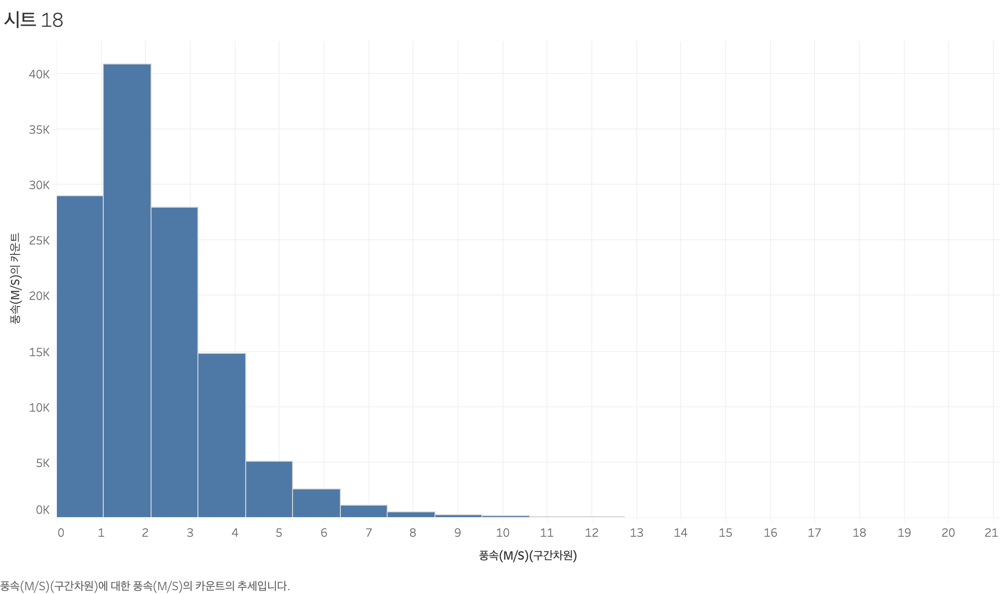

In [328]:
Image('/Users/kyungmo/Desktop/energy/wind.png')

#### 대부분의 풍속이 8m/s 안에 포함되어있으며, 기상청에서는 풍속 4m/s 미만을 '약한바람'으로 규정하고 있으므로, 4m/s 미만과 이상으로 구간화를 진행하였다.

In [329]:
def wind(x:float)->int:
    
    if x >= 4:
        return 0
    elif x < 4:
        return 1
    
train['풍속구간'] = train['wind'].apply(wind)

### 기온 구간화

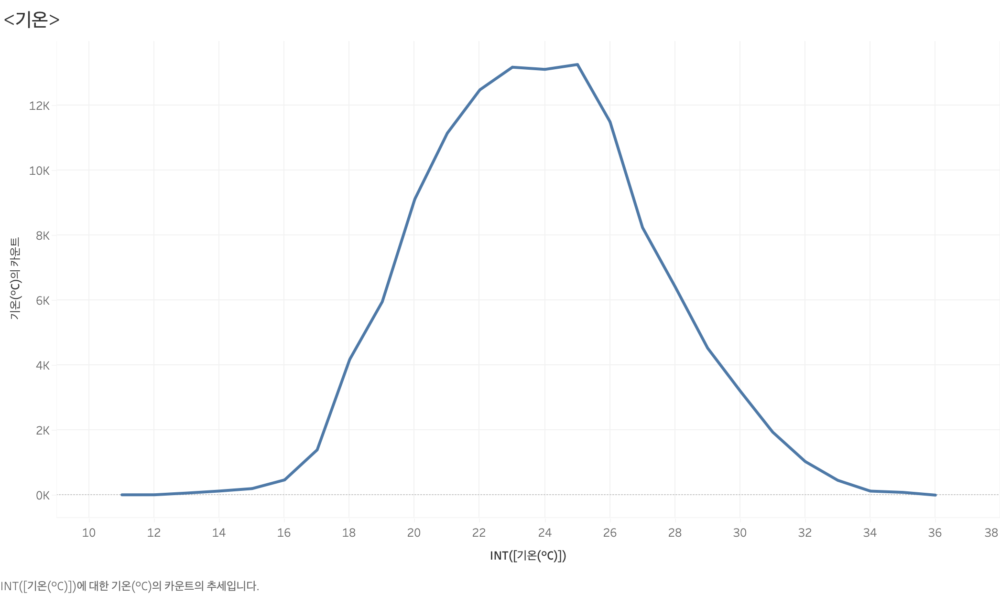

In [330]:
Image('/Users/kyungmo/Desktop/energy/gion.png')

**기온의 분포를 확인하여 31도 이상, 31도 미만 26도 이상, 26도 미만 20도 이상, 20도 미만으로 총 네 구간으로 나누어보자.**

In [331]:
def gion(x:float)->int:
    if x >= 31:
        return 1
    elif (x >= 26) & (x < 31) :
        return 2
    elif (x >= 20) & (x < 26) :
        return 3
    elif (x < 20) :
        return 4

    
train['온도구간'] = train['temp'].apply(gion)

### 건물별 풍속,온도 중앙값 계산

In [332]:

by_poong = train.groupby(['num','풍속구간'])['target'].median().reset_index().pivot('num','풍속구간','target').reset_index()
by_temp = train.groupby(['num','온도구간'])['target'].median().reset_index().pivot('num','온도구간','target').reset_index().drop('num', axis = 1)
df = pd.concat([by_poong, by_temp], axis= 1)


In [333]:
df_scaled = df.iloc[:,1:] #건물 번호는 제외

**정확한 군집화를 위해 scaling을 해주자.**

In [334]:
# standard scaling
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(df_scaled)
df_scaled = scaler.transform(df_scaled)


In [335]:
df_scaled = pd.DataFrame(data=df_scaled, columns=['풍속0','풍속1','온도0','온도1','온도2','온도3'])

In [336]:
df_scaled

,풍속0,풍속1,온도0,온도1,온도2,온도3
0,3.295988,3.686087,2.059138,2.991752,3.806442,4.273088
1,-0.652066,-0.563206,-0.467938,-0.649009,-0.533371,-0.490716
2,0.509200,0.715601,0.056947,0.377801,0.769486,0.941326
3,-0.848902,-0.882119,-0.783034,-0.909620,-0.932942,-0.916283
4,0.203447,0.344715,-0.029789,0.105128,0.373986,0.589608
5,-0.512263,-0.761802,-0.245173,-0.642086,-0.773619,-0.750330
6,-0.382682,-0.406816,-0.356318,-0.579151,-0.388341,-0.270723
7,2.377693,2.567430,4.799249,2.978914,2.522993,2.484452
8,-0.616294,-0.470626,-0.788436,-0.692985,-0.432041,-0.313975
9,-0.095063,-0.803777,-0.069027,-0.048923,-0.780694,-0.867431


In [337]:
df_num = df.iloc[:,0]


In [338]:
#건물 번호와 합치기
df_scaled = pd.concat([df_num,df_scaled],ignore_index=True,axis=1)

In [339]:
index = ['num','wind0','wind1', 'temp0','temp1','temp2','temp3']
df_scaled.columns = index

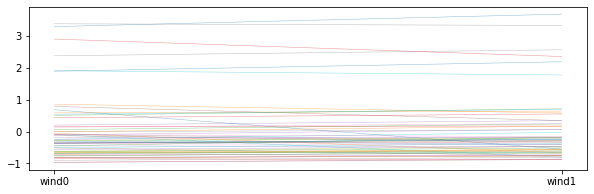

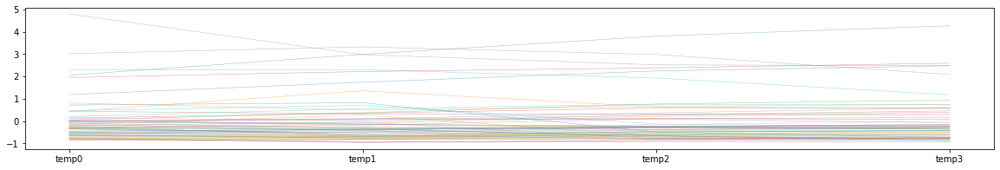

In [340]:
fig = plt.figure(figsize = (10,3))
for i in range(len(df_scaled)):
    plt.plot(df_scaled.iloc[i, 1:3], alpha = 0.5, linewidth = 0.5)
fig = plt.figure(figsize = (20,3))
for i in range(len(df_scaled)):
    plt.plot(df_scaled.iloc[i, 3:], alpha = 0.5, linewidth = 0.5)

온도와 풍속이 유의미하게 전력사용량과 관련이 있는지는 시각화를 통해 알아보기는 힘든것 같다.

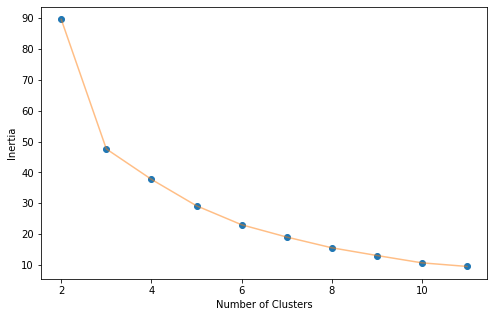

In [341]:
from sklearn.cluster import KMeans
def change_n_clusters(n_clusters, train):
    sum_of_squared_distance = []
    for n_cluster in n_clusters:
        kmeans = KMeans(n_clusters=n_cluster)
        kmeans.fit(train)
        sum_of_squared_distance.append(kmeans.inertia_)
        
    plt.figure(1 , figsize = (8, 5))
    plt.plot(n_clusters , sum_of_squared_distance , 'o')
    plt.plot(n_clusters , sum_of_squared_distance , '-' , alpha = 0.5)
    plt.xlabel('Number of Clusters')
    plt.ylabel('Inertia')

change_n_clusters([2,3,4,5,6,7,8,9,10,11], df_scaled.iloc[:,1:])

군집 수를 4개로 지정하자.

In [342]:
kmeans = KMeans(n_clusters=4, random_state = 123)
km_cluster = kmeans.fit_predict(df_scaled.iloc[:,1:])

In [343]:
df_scaled['km_cluster'] = km_cluster


In [344]:
data_eda = pd.merge(train, df_scaled[['num', 'km_cluster']], how='left', on='num')

### 군집별 heatmap

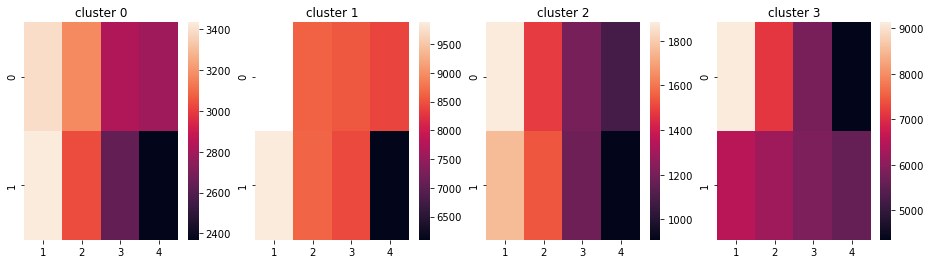

In [345]:
fig = plt.figure(figsize = (20, 4))
for c in range(4):
    temp = data_eda[data_eda.km_cluster == c]
    temp = temp.groupby(['풍속구간', '온도구간'])['target'].median().reset_index().pivot('풍속구간', '온도구간', 'target')
    plt.subplot(1, 5, c+1)
    sns.heatmap(temp)
    plt.title(f'cluster {c}')
    plt.xlabel('')
    plt.ylabel('')
    


* cluster0 : 풍속과 온도에 따른 전력 사용량이 차이나며 대체적인 전력 사용량이 낮은 건물
* cluster1 : 온도가 높을때는 풍속에 따른 전력 사용량이 차이나지 않지만, 온도가 낮을때는 전력 사용량의 차이가 큰 건물, 또한 대체적으로 전력 사용량이 매우 높음
* cluster2 : 풍속과 온도에 따른 전력 사용량이 차이나며, 대체적인 전력 사용량이 가장 낮은 건물
* cluster3 : 풍속이 조금 높을때는 온도에 따른 변화가 크지만, 풍속이 낮을때는 온도 변화에 따른 전력 사용량의 차이가 거의 없는 건물